# Sentinel-2 Analysis Notebook

In [1]:
!jupyter nbextension enable toc

import netCDF4 as nc
from os import listdir
import re
import numpy as np
import geopandas as gpd
import pandas as pd
import xarray as xr
from matplotlib.pyplot import figure
from scipy import spatial
from numpy import ravel
import datetime
import re
import matplotlib.pyplot as plt
from mpl_toolkits.basemap import Basemap
import os
from itertools import compress
from scipy.stats import pearsonr


from sklearn.ensemble import RandomForestRegressor
from numpy import mean
from numpy import std
from numpy import arange
from sklearn.metrics import mean_absolute_error
from sklearn.datasets import make_classification
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import RandomForestClassifier
from matplotlib import pyplot
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
from sklearn.impute import SimpleImputer
from sklearn.feature_selection import RFE
from boruta import BorutaPy
import sys
import sklearn.neighbors._base
sys.modules['sklearn.neighbors.base'] = sklearn.neighbors._base
from missingpy import MissForest
from sklearn.impute import KNNImputer
from sklearn.pipeline import make_pipeline


pd.set_option('display.max_columns', 10)
pd.set_option('display.max_rows', 10)

Enabling notebook extension toc...
      - Validating: OK


## Get Shapefiles and our spatial data

In [2]:
df3 = pd.read_csv("/Users/maxbeal/Desktop/PhD/Sampling/Mendota_data/Final Data/Mendota_all_data.csv")


def listdir_fullpath(d):
    return [os.path.join(d, f) for f in os.listdir(d)]


# Get shapefiles
mendota = gpd.read_file("/Users/maxbeal/Desktop/PhD/Sampling/Mendota Shapefiles/Mendotaboundary.shp")
#gridshp = gpd.read_file("/Users/maxbeal/Desktop/PhD/Sampling/box_sampling_bryan/MendotaSamplingBoundaries.shp")
gridshp = gpd.read_file("/Users/maxbeal/Desktop/PhD/Sampling/Mendota Shapefiles/Mendotaboundary_gridnums.shp")
print(mendota.crs)
mendota = mendota.to_crs("EPSG:4326")
gridshp = gridshp.to_crs("EPSG:4326")


df = pd.read_csv('/Users/maxbeal/Desktop/PhD/Sampling/Mendota_data/Final Data/mendota_reference_all.csv')
crs = mendota.crs
gdf = gpd.GeoDataFrame(df, crs=crs, geometry=gpd.points_from_xy(df.long, df.lat))


gdf = gdf[gdf['Notes']!="shoreline"] #Remove shoreline points

#Get image dates
files = listdir_fullpath('/Volumes/Data Drive/RemoteSensing/s2_OUT/files')

bl = []
for i in files:
    bl.append(i.endswith(".tif"))
    
l2w=list(compress(files,bl))


img_dates=[]
for i in l2w:
    img_date=str(datetime.date(int(i[55:59:1]),int(i[60:62:1]),int(i[63:65:1])))
    img_dates.append(img_date)

gdfDates = gdf['Date']


gdfDates=np.array(gdfDates)
bl2 = []

for day in img_dates:
    bl2.append(day in gdfDates)

datelist=list(compress(img_dates,bl2))



epsg:3071


### Convert RFUs to ug/L

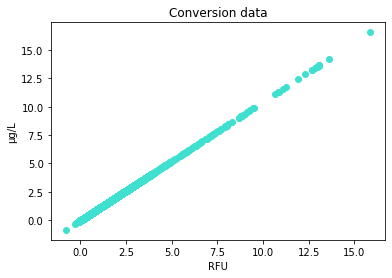

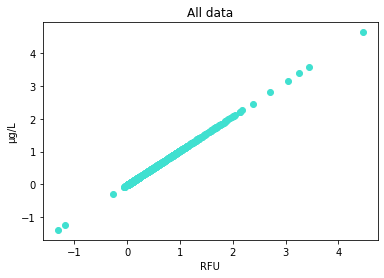

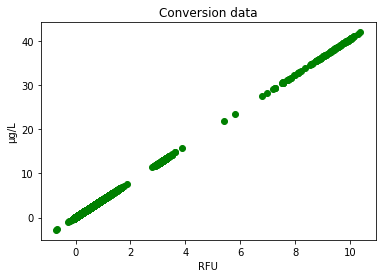

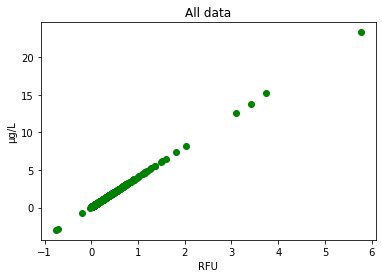

In [3]:
from sklearn import linear_model
df2 = pd.read_csv('/Users/maxbeal/Desktop/PhD/Sampling/Mendota_data/Final Data/Mendota_all_data.csv')
conv = pd.read_csv('/Users/maxbeal/Desktop/PhD/Sampling/Sampling Data/RFU_ugL_2019.csv') #RFU to ugL, note conversion data isn't averaged

df2=df2.dropna(subset=['BGA.PC.RFU'])

#Phycocyanin
plt.title('Conversion data')
plt.scatter(conv['BGA-PC RFU'],conv['BGA-PC µg/L'],facecolor="turquoise")
plt.xlabel('RFU')
plt.ylabel('µg/L')
plt.show()

#Create Regression
X=conv['BGA-PC RFU'].values.reshape(-1,1)
Y=conv['BGA-PC µg/L'].values.reshape(-1,1)

pc_lm = linear_model.LinearRegression()
pc_lm.fit(X,Y)

df2['BGA.PC.µgL']=pc_lm.predict(df2['BGA.PC.RFU'].values.reshape(-1,1))

plt.title('All data')
plt.scatter(df2['BGA.PC.RFU'],df2['BGA.PC.µgL'],facecolor="turquoise")
plt.xlabel('RFU')
plt.ylabel('µg/L')
plt.show()

#set negative values to 0
#df2.loc[df2['BGA.PC.RFU'] < 0, 'BGA.PC.RFU'] = 0

#Chlorophyll-a
plt.title('Conversion data')
plt.scatter(conv['Chlorophyll RFU'],conv['Chlorophyll µg/L'],facecolor="g")
plt.xlabel('RFU')
plt.ylabel('µg/L')
plt.show()

#Create Regression
X=conv['Chlorophyll RFU'].values.reshape(-1,1)
Y=conv['Chlorophyll µg/L'].values.reshape(-1,1)

chl_lm = linear_model.LinearRegression()
chl_lm.fit(X,Y)

df2['Chlorophyll.µgL']=chl_lm.predict(df2['Chlorophyll.RFU'].values.reshape(-1,1))

plt.title('All data')
plt.scatter(df2['Chlorophyll.RFU'],df2['Chlorophyll.µgL'],facecolor="g")
plt.xlabel('RFU')
plt.ylabel('µg/L')
plt.show()

#set negative values to 0
df2.loc[df2['Chlorophyll.µgL'] < 0, 'Chlorophyll.µgL'] = 0
df2.loc[df2['BGA.PC.µgL'] < 0, 'BGA.PC.µgL'] = 0



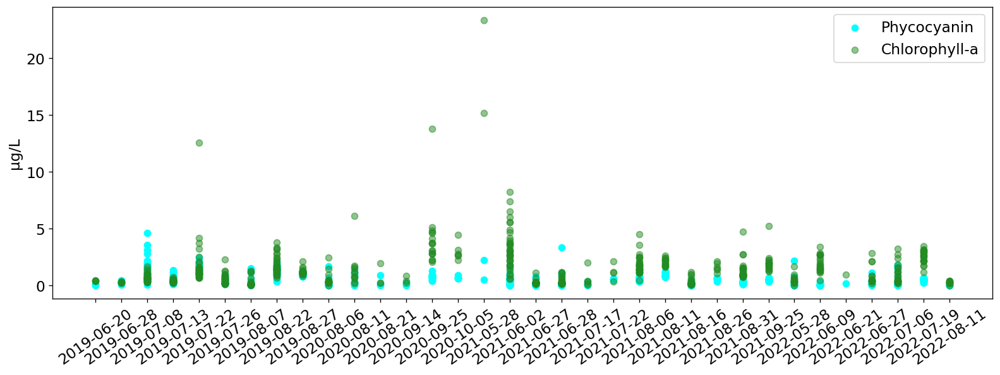

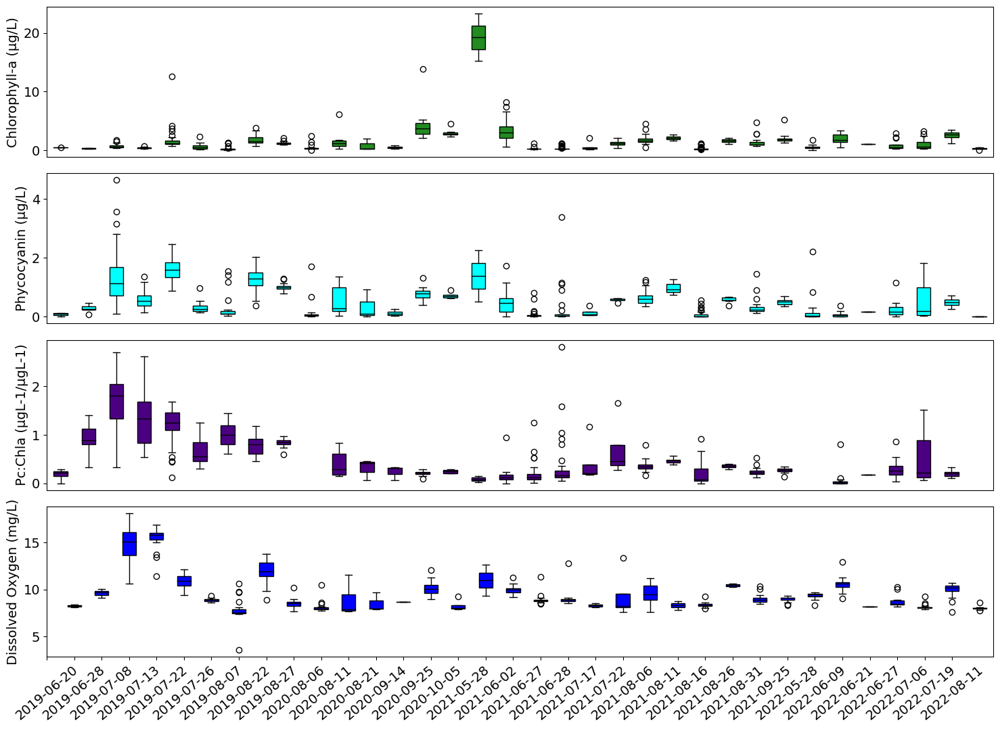

In [4]:
plt.style.use("default")
plt.rcParams["font.size"] = 14
df2.sort_values(by='Date',inplace=True)

figure(figsize=(16, 5), dpi=120)
plt.xticks(rotation=35)
plt.scatter(df2['Date'],df2['BGA.PC.µgL'], label="Phycocyanin",facecolor="cyan")
plt.scatter(df2['Date'],df2['Chlorophyll.µgL'], label="Chlorophyll-a",facecolor="forestgreen",alpha=0.5)
plt.ylabel('µg/L')
plt.legend()
plt.show()




bplt = df2
bplt.sort_values(by="Date",inplace=True)
bplt["Pc/Chla"] = bplt['BGA.PC.µgL']/bplt['Chlorophyll.µgL']

dts=set(bplt["Date"])

dts=list(dts)

dts.sort()

grouped=bplt.groupby("Date")
# create a figure and axis object
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(15,11))

# plot boxplots for each month
box1=ax[0].boxplot([grouped.get_group(dts[i])['Chlorophyll.µgL'] for i in range(0,len(dts))],patch_artist=True)
for item in ['whiskers', 'fliers', 'medians', 'caps']:
        plt.setp(box1[item], color='black')
plt.setp(box1["boxes"], facecolor='forestgreen')
ax[0].set_ylabel("Chlorophyll-a (µg/L)")
ax[0].set_xticks([])

box2=ax[1].boxplot([grouped.get_group(dts[i])['BGA.PC.µgL'] for i in range(0,len(dts))],patch_artist=True)
for item in ['whiskers', 'fliers', 'medians', 'caps']:
        plt.setp(box2[item], color='black')
plt.setp(box2["boxes"], facecolor='cyan')
ax[1].set_ylabel("Phycocyanin (µg/L)")
ax[1].set_xticks([])

box3=ax[2].boxplot([grouped.get_group(dts[i])['Pc/Chla'] for i in range(0,len(dts))],patch_artist=True)
for item in ['whiskers', 'fliers', 'medians', 'caps']:
        plt.setp(box3[item], color='black')
plt.setp(box3["boxes"], facecolor='indigo')
ax[2].set_ylabel("Pc:Chla (µgL-1/µgL-1)")
ax[2].set_xticks([])

box4=ax[3].boxplot([grouped.get_group(dts[i])['ODO.mg.L'] for i in range(0,len(dts))],patch_artist=True)
for item in ['whiskers', 'fliers', 'medians', 'caps']:
        plt.setp(box4[item], color='black')
plt.setp(box4["boxes"], facecolor='blue')
ax[3].set_ylabel("Dissolved Oxygen (mg/L)")
ax[3].set_xticks(ticks=range(0,len(dts)),labels=list(dts),rotation=40)

fig.tight_layout()
plt.show()




## Extract image data

Trying image from: 2019-07-13
Image CRS: EPSG:32615
Mendota within image bounds, extracting data...
Image CRS: EPSG:32616
Mendota partially in image bounds
2019-07-13 complete
Trying image from: 2019-08-22
Image CRS: EPSG:32615
Mendota within image bounds, extracting data...
Image CRS: EPSG:32616
Mendota partially in image bounds
2019-08-22 complete
Trying image from: 2020-08-06
Image CRS: EPSG:32615
Mendota within image bounds, extracting data...
Image CRS: EPSG:32616
Mendota partially in image bounds
2020-08-06 complete
Trying image from: 2020-09-25
Image CRS: EPSG:32615
Mendota within image bounds, extracting data...
Image CRS: EPSG:32616
Mendota partially in image bounds
2020-09-25 complete
Trying image from: 2021-06-02
Image CRS: EPSG:32615
Mendota within image bounds, extracting data...
Image CRS: EPSG:32616
Mendota partially in image bounds
2021-06-02 complete
Trying image from: 2021-06-12
Image CRS: EPSG:32615
Mendota within image bounds, extracting data...
Image CRS: EPSG:3261

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


Mendota partially in image bounds
2022-08-11 complete
Done
(3, 166, 153)


<Axes: >

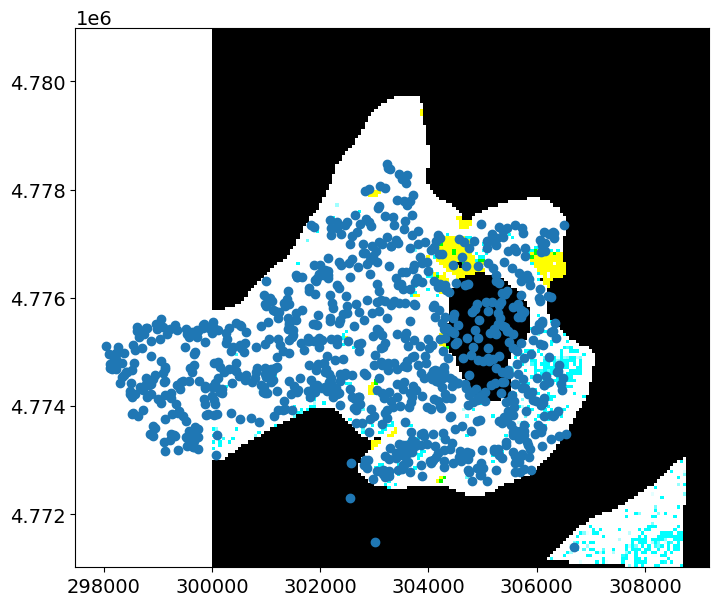

In [5]:
import rasterio
from rasterio.mask import mask
from rasterio.plot import reshape_as_raster, reshape_as_image
from rasterio.plot import show
import matplotlib.pyplot as plt
import sys

import geopandas as gpd
from shapely.geometry import mapping
import geojson


# create empty numpy arrays to hold the X and y variables
X = np.array([], dtype=np.int16).reshape(0,17) # pixels for training
y = np.array([], dtype=np.int8) # grids for training
z = np.array([], dtype=object) #dates for training

for i in np.unique(datelist):    
   
    #Get files for a sampling date
    file_subset = []
    bl2 = []
    for day in img_dates:
        bl2.append(i in day)
        
    file_subset=list(compress(l2w,bl2))
    
    
    print('Trying image from:',i)

    #open image files for date of interest
    file_list=[]
    for img in file_subset:
        open_img=rasterio.open(img)
        file_list.append(open_img)
    
    #Split by CRS
    files_32615 = []
    files_32616 = []
    bl_32615 = []
    bl_32616 = []
    for file in file_list:
        bl_32615.append(str(file.crs) == 'EPSG:32615')
        bl_32616.append(str(file.crs) == 'EPSG:32616')
        
    file_32615=list(compress(file_list,bl_32615))
    file_32616=list(compress(file_list,bl_32616))
        
    images = [file_32615,file_32616]
    images=list(filter(None, images))
    
    for img in images:
        print('Image CRS:',img[0].crs)
        
        #if img[0].crs == "EPSG:32616":
            #print("skipping...")
            #continue

    
        
        #Subset sample points for date of interest
        gdf = gdf.to_crs(img[0].crs)
        points = gdf[gdfDates==str(i)]
        geoms = points.geometry.values 

        mendota = mendota.to_crs(img[0].crs)
        bounds = mendota.bounds
        boundary = mendota.values.tolist()


        # Read metadata of first file
        meta = img[0].meta

        # Update meta to reflect the number of layers
        meta.update(count = len(img))

        # Read each layer and write it to stack
        with rasterio.open('stack.tif', 'w', **meta) as dst:
            for id, layer in enumerate(img, start=1):
                with layer as src1:
                    dst.write_band(id, src1.read(1))

        # extract the raster values within each point for the stacked image
        with rasterio.open('stack.tif') as src:
            band_count = src.count
            #See if mendota is within the image
            b = (bounds['minx'] > src.bounds[0]) & (bounds['maxx']<src.bounds[2]) & (bounds['miny'] > src.bounds[1]) & (bounds['maxy']<src.bounds[3])
            b2 = (bounds['maxx']<src.bounds[2]) & (bounds['miny'] > src.bounds[1]) & (bounds['maxy']<src.bounds[3]) #EPSG 32616 will only be paritally in bounds
            if b[0]==True:
              print('Mendota within image bounds, extracting data...')
              for index, geom in enumerate(geoms):
                  feature = [mapping(geom)]

                  # the mask function returns an array of the raster pixels within this feature
                  out_image, out_transform = mask(src, feature, crop=True) 
                  # eliminate all the pixels with 0 values for all 18 bands - AKA not actually part of the shapefile
                  out_image_trimmed = out_image[:,~np.all(out_image == 0, axis=0)]
                  # eliminate all the pixels with XXX values for all bands
                  # this would be done to remove missing data values (if any)
                  #out_image_trimmed = out_image_trimmed[:,~np.all(out_image_trimmed == 255, axis=0)]
                  # reshape the array to [pixel count, bands]
                  out_image_reshaped = out_image_trimmed.reshape(-1, band_count)
                  # append the grid numbers to the y array
                  y = np.append(y,[points["Grid"].iloc[index]] * out_image_reshaped.shape[0]) 
                  # append the dates to the z array
                  z = np.append(z,[points["Date"].iloc[index]] * out_image_reshaped.shape[0]) 
                  # stack the pixels onto the pixel array
                  X = np.vstack((X,out_image_reshaped))  
                    
            elif b2[0]==True:
                print('Mendota partially in image bounds')
                for index, geom in enumerate(geoms):
                  feature = [mapping(geom)]
                  if geom.x>src.bounds[0]:
                      # the mask function returns an array of the raster pixels within this feature
                      out_image, out_transform = mask(src, feature, crop=True) 
                      # eliminate all the pixels with 0 values for all 18 bands - AKA not actually part of the shapefile
                      out_image_trimmed = out_image[:,~np.all(out_image == 0, axis=0)]
                      # eliminate all the pixels with XXX values for all bands
                      # this would be done to remove missing data values (if any)
                      #out_image_trimmed = out_image_trimmed[:,~np.all(out_image_trimmed == 255, axis=0)]
                      # reshape the array to [pixel count, bands]
                      out_image_reshaped = out_image_trimmed.reshape(-1, band_count)
                      # append the grid numbers to the y array
                      y = np.append(y,[points["Grid"].iloc[index]] * out_image_reshaped.shape[0]) 
                      # append the dates to the z array
                      z = np.append(z,[points["Date"].iloc[index]] * out_image_reshaped.shape[0]) 
                      # stack the pixels onto the pixel array
                      X = np.vstack((X,out_image_reshaped)) 
                
    
    print(i, 'complete')


print('Done')



src=rasterio.open('stack.tif')
clipped_img = src.read([4,3,2])
print(clipped_img.shape)
fig, ax = plt.subplots(figsize=(10,7))
show(clipped_img[:, :, :], ax=ax, transform=src.transform) # add the transform arg to get it in lat long coords
gdf.plot(ax=ax)



The X matrix is sized: (563, 17)
The y array is sized: (563,)
The y array is sized: (563,)


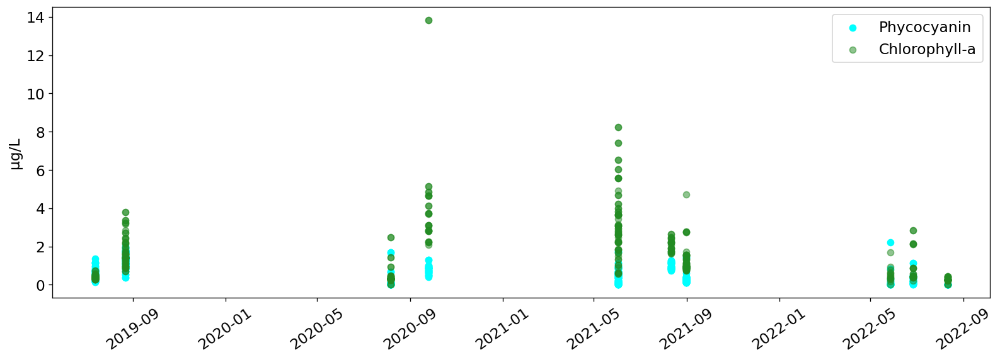

In [6]:
#### We will need a "X" matrix containing our features, and a "y" array containing our labels
print('The X matrix is sized: {sz}'.format(sz=X.shape))
print('The y array is sized: {sz}'.format(sz=y.shape))
print('The y array is sized: {sz}'.format(sz=y.shape))

Grid=pd.DataFrame(y)
Date = pd.DataFrame(z)
Bands=pd.DataFrame(X)

RS = pd.concat([Date,Grid,Bands],axis=1)
#RS.to_csv('~/Desktop/s2_acolite.csv')

bandnames = ['Date','Grid']
for band in img:
    bandnames.append(band.name[-12:-4:1])


RS=RS.set_axis(bandnames, axis=1, inplace=False)
RS['Date']=pd.to_datetime(RS['Date'])

#Read in the phycocyanin and chlorophyll-a sample data
df2['Date']=pd.to_datetime(df2['Date'])

#Merge with the Satellite band extractions
merge=RS.merge(df2, on=['Date','Grid'])

merge['pc/chl'] = merge['BGA.PC.µgL']/merge['Chlorophyll.µgL']


figure(figsize=(16, 5), dpi=120)
plt.xticks(rotation=35)
plt.scatter(merge['Date'],merge['BGA.PC.µgL'], label="Phycocyanin",facecolor="cyan")
plt.scatter(merge['Date'],merge['Chlorophyll.µgL'], label="Chlorophyll-a",facecolor="forestgreen",alpha=0.5)
plt.ylabel('µg/L')
plt.legend()




No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


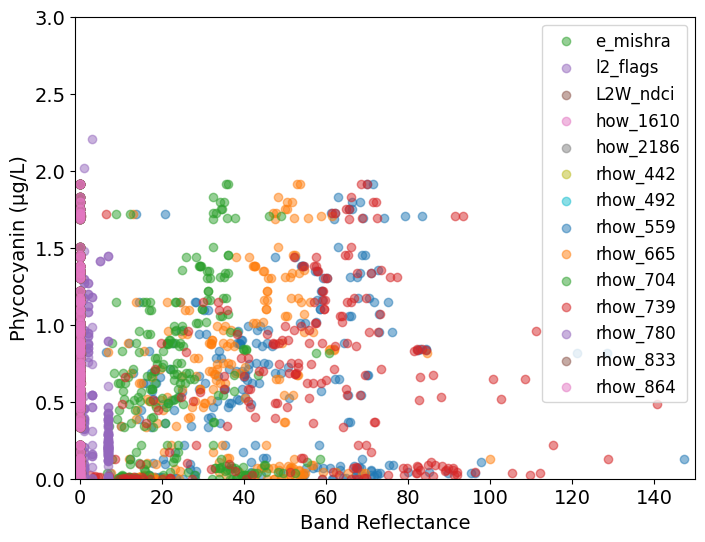

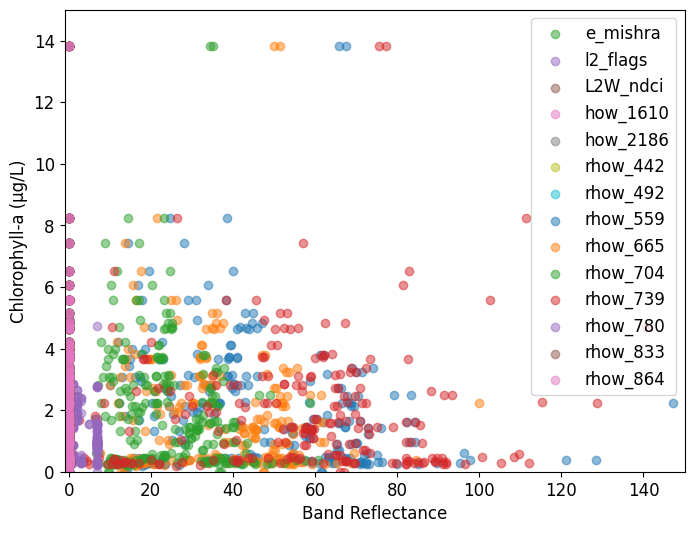

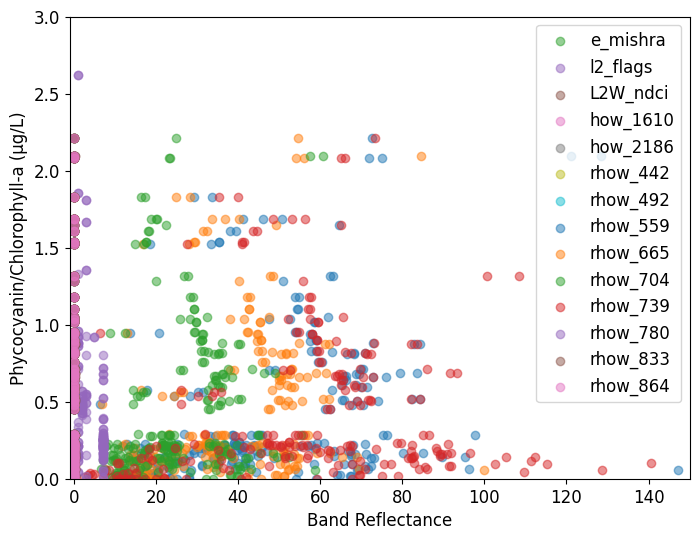

In [10]:
mergesave = merge
fig, ax = plt.subplots(1,1, figsize=[8,6])

plt.style.use("default")
plt.rcParams["font.size"] = 12

for i in range(2,19):
  plt.scatter(merge.iloc[:,i],merge['BGA.PC.µgL'], label=merge.columns[i],alpha=0.5)
  ax.set_xlabel('Band Reflectance')
  ax.set_ylabel('Phycocyanin (µg/L)')
  ax.legend(loc="upper right")
  ax.set_xlim([-1,150])
  ax.set_ylim([0,3])


fig, ax = plt.subplots(1,1, figsize=[8,6])
for i in range(2,19):
  plt.scatter(merge.iloc[:,i],merge['Chlorophyll.µgL'], label=merge.columns[i],alpha=0.5)
  ax.set_xlabel('Band Reflectance')
  ax.set_ylabel('Chlorophyll-a (µg/L)')
  ax.legend(loc="upper right")
  ax.set_xlim([-1,150])
  ax.set_ylim([0,15])
   

fig, ax = plt.subplots(1,1, figsize=[8,6])
for i in range(2,19):
  plt.scatter(merge.iloc[:,i],merge['BGA.PC.µgL']/merge['Chlorophyll.µgL'], label=merge.columns[i],alpha=0.5)
  ax.set_xlabel('Band Reflectance')
  ax.set_ylabel('Phycocyanin/Chlorophyll-a (µg/L)')
  ax.legend(loc="upper right")
  ax.set_xlim([-1,150])
  ax.set_ylim([0,3])

In [11]:
pd.set_option('display.max_columns', 30)
pd.set_option('display.max_rows', 30)

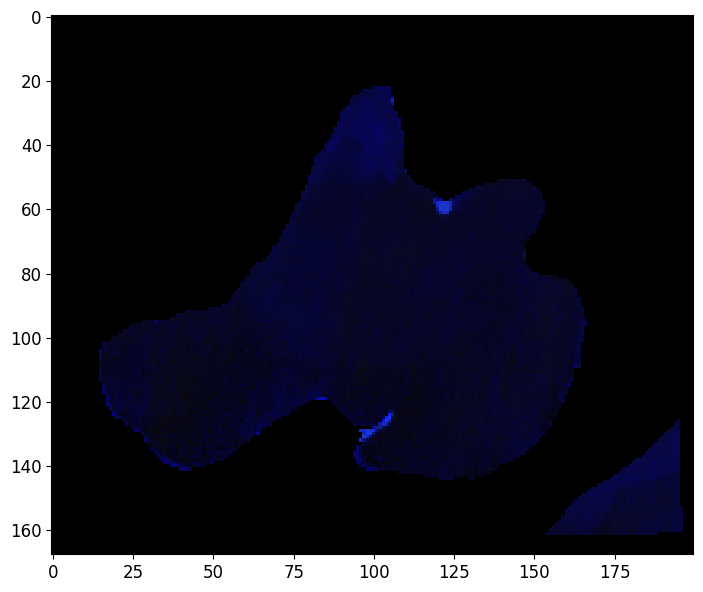

In [12]:

#Open image and convert crs of shapefiles
src=rasterio.open('/Users/maxbeal/Desktop/PhD/Remote Sensing/pseudo_obs/s2_tifs/2020-09-25_32615.tif')
clipped_img = src.read([8,7,6]) #665, 560, 490
image_norm = (clipped_img - np.nanmin(clipped_img)) / (np.nanmax(clipped_img) - np.nanmin(clipped_img))
mendota = mendota.to_crs(src.crs)
gridshp = gridshp.to_crs(src.crs)

gridshp = gridshp[gridshp['ID']!="DH"] #Remove DH

#Representative point returns a cheaply computed point that is guaranteed to be within the geometric object. Good for labels.
gridshp['coords'] = gridshp['geometry'].apply(lambda x: x.representative_point().coords[:])
gridshp['coords'] = [coords[0] for coords in gridshp['coords']]


fig, ax = plt.subplots(figsize=(10,7))
show(image_norm, ax=ax, transform=src.transform) # add the transform arg to get it in lat long coords
#mendota.plot(ax=ax,edgecolor="r",facecolor="gray")
gridshp.plot(ax=ax,edgecolor='white',facecolor="none")
for idx, row in gridshp.iterrows():
    plt.annotate(text=row['ID'], xy=row['coords'],
                 horizontalalignment='center', 
                 bbox={'facecolor': 'white', 'alpha':0.8, 'pad': 2, 'edgecolor':'none'})

rgb=reshape_as_image(image_norm)
rgb = np.clip(rgb,0,1)/1
plt.imshow(rgb)
plt.show()



### Stack and export all tifs as individual images 

In [80]:
for i in np.unique(img_dates):    
   
    #Get files for a sampling date
    file_subset = []
    bl2 = []
    for day in img_dates:
        bl2.append(i in day)
        
    file_subset=list(compress(l2w,bl2))
    
    print('Trying image from:',i)

    #open image files for date of interest
    file_list=[]
    for img in file_subset:
        open_img=rasterio.open(img)
        file_list.append(open_img)
    
    #Split by CRS
    files_32615 = []
    files_32616 = []
    bl_32615 = []
    bl_32616 = []
    for file in file_list:
        bl_32615.append(str(file.crs) == 'EPSG:32615')
        bl_32616.append(str(file.crs) == 'EPSG:32616')
        
    file_32615=list(compress(file_list,bl_32615))
    file_32616=list(compress(file_list,bl_32616))
        
    images = [file_32615,file_32616]
    
    for img in images:
        if len(img)>0:
            print('Image CRS:',img[0].crs)

            #Subset sample points for date of interest
            gdf = gdf.to_crs(img[0].crs)
            points = gdf[gdfDates==str(i)]
            geoms = points.geometry.values 

            mendota = mendota.to_crs(img[0].crs)
            bounds = mendota.bounds
            boundary = mendota.values.tolist()


            # Read metadata of first file
            meta = img[0].meta

            # Update meta to reflect the number of layers
            meta.update(count = len(img))

            print('Saving image...')
            # Read each layer and write it to stack
            with rasterio.open('pseudo_obs/s2_tifs/{0}_{1}.tif'.format(i,str(img[0].crs)[5:10]), 'w', **meta) as dst:
                for id, layer in enumerate(img, start=1):
                    with layer as src1:
                        dst.write_band(id, src1.read(1))

Trying image from: 2016-04-19
Image CRS: EPSG:32615
Saving image...
Image CRS: EPSG:32616
Saving image...
Trying image from: 2016-05-19
Image CRS: EPSG:32615
Saving image...
Image CRS: EPSG:32616
Saving image...
Trying image from: 2016-06-08
Image CRS: EPSG:32615
Saving image...
Image CRS: EPSG:32616
Saving image...
Trying image from: 2016-06-28
Image CRS: EPSG:32615
Saving image...
Image CRS: EPSG:32616
Saving image...
Trying image from: 2016-07-18
Image CRS: EPSG:32615
Saving image...
Image CRS: EPSG:32616
Saving image...
Trying image from: 2016-08-07
Image CRS: EPSG:32615
Saving image...
Image CRS: EPSG:32616
Saving image...
Trying image from: 2016-08-27


KeyboardInterrupt: 

## Explanatory Models

### Data Cleaning

In [7]:
#merge = mergesave

#Band math
B1 = merge.iloc[:,10] #Coastal aerosol
B2 = merge.iloc[:,11] #blue
B3 = merge.iloc[:,12] #green
B4 = merge.iloc[:,13] #red
B5 = merge.iloc[:,14] #vegetation red edge
B6 = merge.iloc[:,15] #vegetation red edge
B7 = merge.iloc[:,16] #vegetation red edge
B8 = merge.iloc[:,17] #NIR
B8A = merge.iloc[:,18] #vegetation red edge
B11 = merge.iloc[:,8] #swir
B12 = merge.iloc[:,9] #swir



#Band math
#'B8A - (B4 + (B11 - B4) * ((865 - 665) / (1610 - 665)))'
FAI = B8A - (B4 + (B11 - B4) * ((865 - 665) / (1610 - 665)))
merge['FAI'] = FAI

#'B6/B4'
B6B4div = B6/B4
merge['B6B4div'] = B6B4div

#'B6-B4'
B6B4sub = B6-B4
merge['B6B4sub'] = B6B4sub
          
#'B6/B5'
B6B5div = B6/B5
merge['B6B5div'] = B6B5div

#'B6-B5'
B6B5sub = B6-B5
merge['B6B5sub'] = B6B5sub

#'B5/B4'
B5B4div = B5/B4
merge['B5B4div'] = B5B4div

#'B5-B4'
B5B4sub = B5-B4
merge['B5B4sub'] = B5B4sub
          
#'B3-B4+B2-B4'
B3B4_B2B4sub = B3-(B4+B2-B4)
merge['B3B4_B2B4sub'] = B3B4_B2B4sub
          
#'(B6-B4)/(B6+B4)'
B6B4divB6B4 = (B6-B4)/(B6+B4)
merge['B6B4divB6B4'] = B6B4divB6B4

#'(B6-B5)/(B6+B5)'
B6B5divB6B5 = (B6-B5)/(B6+B5)
merge['B6B5divB6B5'] = B6B5divB6B5
          
#'(B5-B4)/(B5+B4)'
B5B4divB5B4 = (B5-B4)/(B5+B4)
merge['B5B4divB5B4'] = B5B4divB5B4

#'(B5-B4)/(B2+B3)'
#B5B4divB2B3 = (B5-B4)/(B2+B3)
#merge['B5B4divB2B3'] = B5B4divB2B3

#'(1/B5)-(1/B4)-(B6)'
B5B4invB6sub = (1/B5)-(1/B4)-(B6)
merge['B5B4invB6sub'] = B5B4invB6sub


In [8]:
from sklearn.preprocessing import StandardScaler

predictands = ['Chlorophyll.µgL','BGA.PC.µgL',"pc/chl"]

#predictand = 'Chlorophyll.µgL'
#predictand = 'BGA.PC.µgL'
#predictand = "pc/chl"
#Get rid of not predictands from merge
cols = list(range(2,19))+list(range(35,46))

#Variables of interest, subset merge
voi=list(merge.columns[cols])
voi.append('Chlorophyll.µgL')
voi.append('BGA.PC.µgL')
voi.append("pc/chl")

Xtest_dict = {}
Xtrain_dict = {}

Ytest_dict = {}
Ytrain_dict = {}

merge = merge.dropna(subset=voi)

for predictand in predictands:

    #Define X and y from parent dataframe
    X = merge.iloc[:,cols]
    y = merge[predictand]
    

    # import a library for spliting data into random train and test subsets
    from sklearn.model_selection import train_test_split

    #Scale data
    scaler = StandardScaler()
    scaler.fit(X)
    Xsc=scaler.transform(X)

    # i.e. 70 % training dataset and 30 % test datasets
    X_train, X_test, Y_train, Y_test = train_test_split(Xsc, y, test_size = 0.3, random_state=0)

    X_train = pd.DataFrame(X_train)
    X_train.columns = X_train.columns

    X_test = pd.DataFrame(X_test)
    X_test.columns = X_test.columns
    
    Xtest_dict[predictand] = X_test
    Xtrain_dict[predictand] = X_train

    Ytest_dict[predictand] = Y_test
    Ytrain_dict[predictand] = Y_train
    


### Random Forest

Train-Test RF Model


------Support and Ranking for each feature------
Doesn't pass the test:  _bramich  - Ranking:  26
Doesn't pass the test:  _re_gons  - Ranking:  24
Doesn't pass the test:  e_mishra  - Ranking:  26
Doesn't pass the test:  _moses3b  - Ranking:  19
Doesn't pass the test:  l2_flags  - Ranking:  29
Doesn't pass the test:  L2W_ndci  - Ranking:  28
Doesn't pass the test:  how_1610  - Ranking:  8
Doesn't pass the test:  how_2186  - Ranking:  9
Doesn't pass the test:  rhow_442  - Ranking:  5
Doesn't pass the test:  rhow_492  - Ranking:  6
Passes the test:  rhow_559  - Ranking:  1
Doesn't pass the test:  rhow_665  - Ranking:  12
Doesn't pass the test:  rhow_704  - Ranking:  2
Doesn't pass the test:  rhow_739  - Ranking:  18
Doesn't pass the test:  rhow_780  - Ranking:  23
Doesn't pass the test:  rhow_833  - Ranking:  20
Doesn't pass the test:  rhow_864  - Ranking:  21
Doesn't pass the test:  FAI  - Ranking:  6
Doesn't pass the test:  B6B4div  - Ranking:  17
Doesn't pass the test:  B6B4sub  - Ran

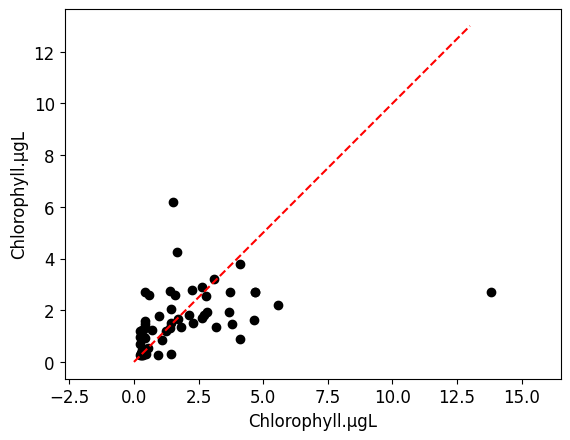

Mean Absolute Error (MAE): 1.0256791252377881
Mean Squared Error (MSE): 3.691117026350871
Root Mean Squared Error (RMSE): 1.921227999574978
Pearson r (0.4344573217907247, 0.0004182952565719134)
number of test points: 62

------Support and Ranking for each feature------
Doesn't pass the test:  _bramich  - Ranking:  18
Doesn't pass the test:  _re_gons  - Ranking:  20
Doesn't pass the test:  e_mishra  - Ranking:  15
Doesn't pass the test:  _moses3b  - Ranking:  9
Doesn't pass the test:  l2_flags  - Ranking:  21
Doesn't pass the test:  L2W_ndci  - Ranking:  13
Doesn't pass the test:  how_1610  - Ranking:  3
Doesn't pass the test:  how_2186  - Ranking:  16
Passes the test:  rhow_442  - Ranking:  1
Passes the test:  rhow_492  - Ranking:  1
Passes the test:  rhow_559  - Ranking:  1
Doesn't pass the test:  rhow_665  - Ranking:  6
Doesn't pass the test:  rhow_704  - Ranking:  2
Doesn't pass the test:  rhow_739  - Ranking:  12
Doesn't pass the test:  rhow_780  - Ranking:  3
Doesn't pass the test

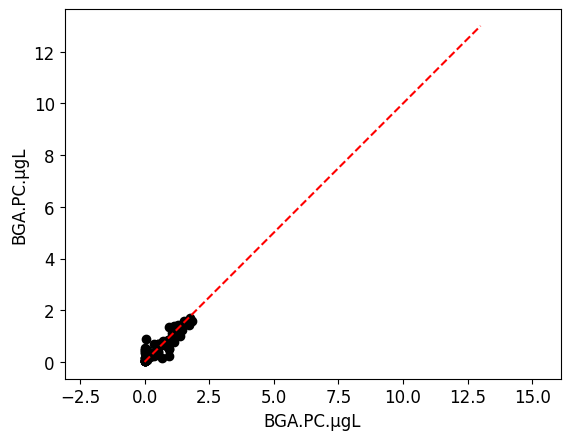

Mean Absolute Error (MAE): 0.19803021213534802
Mean Squared Error (MSE): 0.07276114376325493
Root Mean Squared Error (RMSE): 0.26974273625670614
Pearson r (0.8687731518709826, 5.718461288313901e-20)
number of test points: 62

------Support and Ranking for each feature------
Doesn't pass the test:  _bramich  - Ranking:  16
Doesn't pass the test:  _re_gons  - Ranking:  13
Doesn't pass the test:  e_mishra  - Ranking:  12
Doesn't pass the test:  _moses3b  - Ranking:  3
Doesn't pass the test:  l2_flags  - Ranking:  17
Doesn't pass the test:  L2W_ndci  - Ranking:  14
Passes the test:  how_1610  - Ranking:  1
Doesn't pass the test:  how_2186  - Ranking:  5
Doesn't pass the test:  rhow_442  - Ranking:  2
Doesn't pass the test:  rhow_492  - Ranking:  2
Passes the test:  rhow_559  - Ranking:  1
Doesn't pass the test:  rhow_665  - Ranking:  4
Passes the test:  rhow_704  - Ranking:  1
Doesn't pass the test:  rhow_739  - Ranking:  9
Doesn't pass the test:  rhow_780  - Ranking:  2
Doesn't pass the t

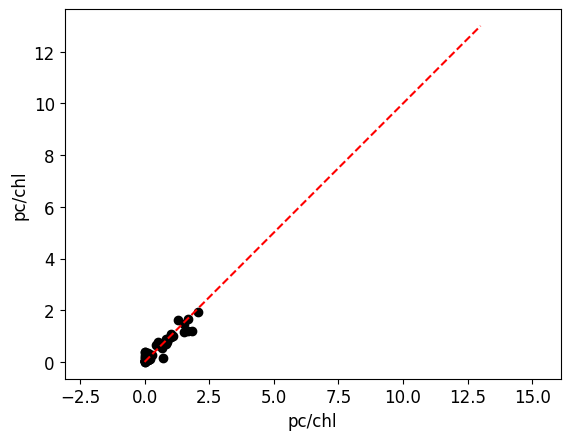

Mean Absolute Error (MAE): 0.10545762857753323
Mean Squared Error (MSE): 0.030714249199780764
Root Mean Squared Error (RMSE): 0.17525481220149353
Pearson r (0.9465043803163363, 3.6419169110420242e-31)
number of test points: 62


In [23]:
model_type="RF"


rf_testout = {}
rf_predout = {}

for predictand in predictands:

    X_test = Xtest_dict[predictand]
    X_train = Xtrain_dict[predictand]

    Y_test = Ytest_dict[predictand]
    Y_train = Ytrain_dict[predictand]



    # importing random forest classifier from assemble module
    import scipy.stats
    from sklearn.ensemble import RandomForestRegressor

    # creating a RF classifier
    rfr = RandomForestRegressor(n_estimators = 500)


    #Feature selection - Boruta
    from boruta import BorutaPy
    feat_selector = BorutaPy(rfr, random_state=42, verbose=0, n_estimators='auto')
    sel = feat_selector.fit(np.array(X_train), np.array(Y_train))
    # print support and ranking for each feature
    print("\n------Support and Ranking for each feature------")
    for i in range(len(feat_selector.support_)):
        if feat_selector.support_[i]:
            print("Passes the test: ", X.columns[i],
                  " - Ranking: ", feat_selector.ranking_[i])
        else:
            print("Doesn't pass the test: ",
                  X.columns[i], " - Ranking: ", feat_selector.ranking_[i])


    best = list(X_train.columns[feat_selector.ranking_==1])

    # Training the model on the training dataset
    # fit function is used to train the model using the training sets as parameters
    rfr.fit(X_train[best], Y_train)

    # performing predictions on the test dataset
    y_pred = rfr.predict(X_test[best])



    rf_testout[predictand] = Y_test
    rf_predout[predictand] = y_pred



    # metrics are used to find accuracy or error
    from sklearn import metrics 


    xy_line = range(0,14)
    plt.plot(xy_line, 'r--')
    plt.scatter(Y_test,y_pred, facecolor="black")
    plt.axis('equal')
    plt.xlabel(predictand)
    plt.ylabel(predictand)
    plt.show()

    print('Mean Absolute Error (MAE):', metrics.mean_absolute_error(Y_test, y_pred))
    print('Mean Squared Error (MSE):', metrics.mean_squared_error(Y_test, y_pred))
    print('Root Mean Squared Error (RMSE):', np.sqrt(metrics.mean_squared_error(Y_test, y_pred)))

    print('Pearson r',scipy.stats.pearsonr(Y_test,y_pred))

    print('number of test points:',len(y_pred))

Cross Validation RF Model

              count
rhow_442          5
rhow_559          5
B3B4_B2B4sub      5
Fold Average Pearson R 0.3414732026645492
Fold Average R-square 0.42681967118103287
Fold Average MAE 0.8371252630500452
              count
rhow_442          5
rhow_559          5
rhow_704          5
FAI               5
B6B4sub           5
B6B5sub           5
B5B4sub           5
B3B4_B2B4sub      5
Fold Average Pearson R 0.42630608869627373
Fold Average R-square 0.6996912981941781
Fold Average MAE 0.2065822069865746
              count
rhow_559          5
rhow_704          5
FAI               5
B6B4sub           5
B3B4_B2B4sub      5
Fold Average Pearson R 0.4302493098143615
Fold Average R-square 0.7207824675131462
Fold Average MAE 0.13804811464176273


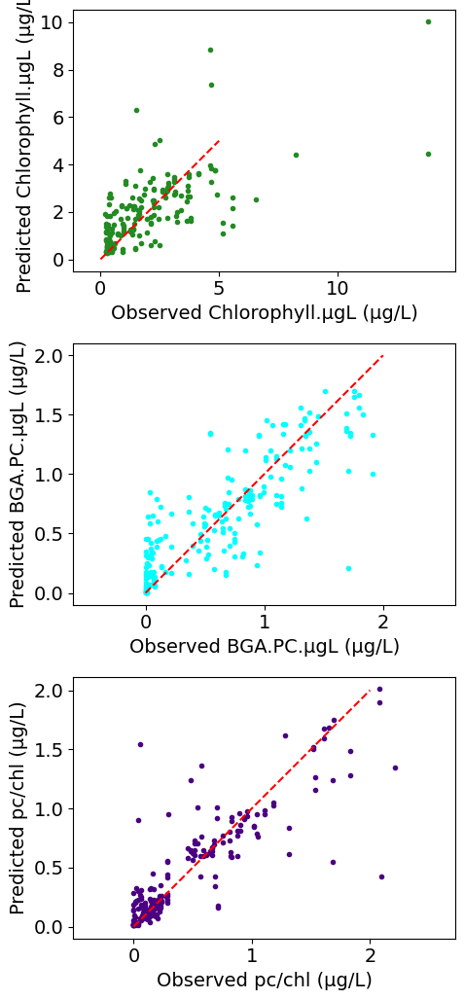

In [9]:
from sklearn.model_selection import RepeatedKFold
from collections import Counter
from itertools import chain

odo = merge['ODO.mg.L']
grid=merge['Grid']
rf_testout = {}
rf_predout = {}
rf_gridout = {}

modelType = ['chl','pc','pcchl']

predictand_names = ['Chlorophyll.µgL','BGA.PC.µgL',"pc/chl"]
cols = ['forestgreen','cyan','indigo']
num=[0,1,2]
lims = [range(0,6),range(0,3),range(0,3)]

bestPreds = []


random_state=42

fig, axs = plt.subplots(nrows=3, ncols=1)
fig.set_size_inches(5, 10.5, forward=True)
axs=axs.flatten()


for name, i in zip(predictands, num):
    
    #Scale data
    scaler = StandardScaler()
    scaler.fit(X)
    Xsc=scaler.transform(X)

    Xsc = pd.DataFrame(Xsc)
    Xsc.columns = X.columns

    kfoldBest, kfoldPreds, fold=[],[],[]
    
    r2RF, pr, mae=[],[],[]
    
    predsRF=pd.DataFrame({'test' : [],'pred' : []})
    odo_cv_rf=pd.DataFrame({'ODO.mg.L' : []})
    grid_cv_rf=pd.DataFrame({'Grid' : []})
    
    splits=5
    rkf = RepeatedKFold(n_splits=splits, n_repeats=1, random_state=random_state)
    for j,(train, test) in enumerate(rkf.split(Xsc)):

        Y = merge[name]
        
        X_train, X_test, Y_train, Y_test, odo_test, grid_test = Xsc.iloc[train], Xsc.iloc[test], Y.iloc[train], Y.iloc[test], odo.iloc[test],grid.iloc[test]

        rfr = RandomForestRegressor(max_depth=None,n_estimators=500)

        #Feature selection - Boruta
        feat_selector = BorutaPy(rfr, random_state=random_state, verbose=0, n_estimators='auto')
        sel = feat_selector.fit(np.array(X_train), np.array(Y_train))

        best = list(X_train.columns[feat_selector.ranking_<=2])
        kfoldBest.append(best)

        rfr.fit(X_train[best], Y_train)

        y_pred = rfr.predict(X_test[best])
        foldResults=pd.DataFrame(zip(Y_test,y_pred), columns = ['test','pred'])
        
        fold.append([j]*len(X_test))
        pr.append(pearsonr(Y_test,y_pred))
        r2RF.append(r2_score(Y_test,y_pred))
        mae.append(mean_absolute_error(Y_test,y_pred))
    
        odo_cv_rf=pd.concat([odo_cv_rf,pd.DataFrame(odo_test)],axis=0) #to keep track of data pairs
        grid_cv_rf=pd.concat([grid_cv_rf,pd.DataFrame(grid_test)],axis=0) #to keep track of data pairs
        predsRF=pd.concat([predsRF,foldResults],axis=0)
    
    
    
    #Look at most common predictors slected
    a=list(chain.from_iterable(kfoldBest))
    a = dict(Counter(a))
    count=pd.DataFrame.from_dict(a, orient='index',columns=["count"])
    count.sort_values(by="count",ascending=False)

    finalVars=count[count['count']==splits]
    print(finalVars)
    
    bestPreds.append(list(finalVars.index))
    xy_line = lims[i]
    axs[i].plot(xy_line, 'r--')
    axs[i].scatter(predsRF['test'],predsRF['pred'], s=9, facecolor=cols[i])
    #axs[i].scatter(predsRF['test'],predsRF['pred'], s=9,c=np.array(list(chain(*fold))))
    axs[i].axis('equal')
    axs[i].set_xlabel('Observed'+' '+Y.name+' '+'(µg/L)')
    axs[i].set_ylabel('Predicted'+' '+Y.name+' '+'(µg/L)')
    

    print('Fold Average Pearson R',np.mean(pr)) #r, p
    print('Fold Average R-square',np.mean(r2RF))
    print('Fold Average MAE',np.mean(mae))

    #joblib.dump(rfr, modelType[i]+"_rf.joblib")
    
    predsRF.append(kfoldPreds)
    
    rf_testout[predictand_names[i]] = predsRF['test']
    rf_predout[predictand_names[i]] = predsRF['pred']
    rf_gridout[predictand_names[i]] = grid_cv_rf['Grid']
    
        

fig.tight_layout()
plt.show()



### Artificial Neural Network

ANN training

In [24]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasRegressor
from keras.models import Sequential
from keras.layers import Dense

np.random.seed(5)

# Make Sure the best variables from RF are used in ANN
rfr = RandomForestRegressor(n_estimators = 500)
from boruta import BorutaPy
feat_selector = BorutaPy(rfr, random_state=42, verbose=0, n_estimators='auto')
sel = feat_selector.fit(np.array(X_train), np.array(Y_train))
best = list(X_train.columns[feat_selector.ranking_==1])


#Evaluating NN models
# repeat some of the initial values here so we make sure they were not changed
input_dim = X_train[best].shape[1] #using best subset from RF here
num_classes = 1


# let's create a function that creates the model (required for KerasClassifier) 
# while accepting the hyperparameters we want to tune 
# we also pass some default values such as optimizer='rmsprop'
def create_model(optimizer='adam', init='uniform'):
    model = Sequential()
    model.add(Dense(128, input_dim=input_dim, kernel_initializer=init, activation='relu'))
    model.add(Dense(64, kernel_initializer=init, activation='relu'))
    model.add(Dense(num_classes, kernel_initializer=init))

    # compile model
    model.compile(loss='mean_squared_error', 
                  optimizer=optimizer, 
                  metrics=['MeanAbsoluteError'])

    return model
	
# fix random seed for reproducibility (this might work or might not work 
# depending on each library's implenentation)
seed = 7
np.random.seed(seed)

# create the sklearn model for the network
model_init_batch_epoch_CV = KerasRegressor(build_fn=create_model, verbose=1)

# we choose the initializers that came at the top in our previous cross-validation!!
#init_mode = ['he_uniform', 'uniform', 'he_normal'] 
#init_mode = ['uniform', 'glorot_normal'] 
init_mode = ['uniform','normal'] 
batches = [10,20,70,147]
epochs = [100,300, 500]

# grid search for initializer, batch size and number of epochs
param_grid = dict(epochs=epochs, batch_size=batches, init=init_mode)
grid = GridSearchCV(estimator=model_init_batch_epoch_CV, 
                    param_grid=param_grid,
                    cv=3)

grid_result = grid.fit(X_train[best], Y_train)

# print results
print(f'Best Accuracy for {grid_result.best_score_:.4} using {grid_result.best_params_}')
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print(f'mean={mean:.4}, std={stdev:.4} using {param}')


    
#Best Accuracy for -0.0308 using {'batch_size': 147, 'epochs': 300, 'init': 'normal'}

Epoch 1/100


<ipython-input-24-26e8e14f05b8>:48: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model_init_batch_epoch_CV = KerasRegressor(build_fn=create_model, verbose=1)


11/11 [==============================] - 0s 2ms/step - loss: 0.0759 - mean_absolute_error: 0.1740
Epoch 2/100
11/11 [==============================] - 0s 2ms/step - loss: 0.0508 - mean_absolute_error: 0.1390
Epoch 3/100
11/11 [==============================] - 0s 1ms/step - loss: 0.0410 - mean_absolute_error: 0.1385
Epoch 4/100
11/11 [==============================] - 0s 1ms/step - loss: 0.0260 - mean_absolute_error: 0.1120
Epoch 5/100
11/11 [==============================] - 0s 2ms/step - loss: 0.0282 - mean_absolute_error: 0.1166
Epoch 6/100
11/11 [==============================] - 0s 2ms/step - loss: 0.0230 - mean_absolute_error: 0.1056
Epoch 7/100
11/11 [==============================] - 0s 1ms/step - loss: 0.0205 - mean_absolute_error: 0.0962
Epoch 8/100
11/11 [==============================] - 0s 2ms/step - loss: 0.0216 - mean_absolute_error: 0.0965
Epoch 9/100
11/11 [==============================] - 0s 2ms/step - loss: 0.0186 - mean_absolute_error: 0.0891
Epoch 10/100
11/11 [==

Epoch 75/100
11/11 [==============================] - 0s 2ms/step - loss: 0.0059 - mean_absolute_error: 0.0497
Epoch 76/100
11/11 [==============================] - 0s 2ms/step - loss: 0.0056 - mean_absolute_error: 0.0507
Epoch 77/100
11/11 [==============================] - 0s 1ms/step - loss: 0.0055 - mean_absolute_error: 0.0507
Epoch 78/100
11/11 [==============================] - 0s 1ms/step - loss: 0.0049 - mean_absolute_error: 0.0441
Epoch 79/100
11/11 [==============================] - 0s 2ms/step - loss: 0.0053 - mean_absolute_error: 0.0459
Epoch 80/100
11/11 [==============================] - 0s 1ms/step - loss: 0.0052 - mean_absolute_error: 0.0478
Epoch 81/100
11/11 [==============================] - 0s 1ms/step - loss: 0.0060 - mean_absolute_error: 0.0471
Epoch 82/100
11/11 [==============================] - 0s 1ms/step - loss: 0.0053 - mean_absolute_error: 0.0509
Epoch 83/100
11/11 [==============================] - 0s 1ms/step - loss: 0.0051 - mean_absolute_error: 0.0494
E

KeyboardInterrupt: 

chla
Pearson R (0.9340923394934153, 5.639018819043175e-29)
MAE 0.49942536832732903
R-square 0.8715298741481217


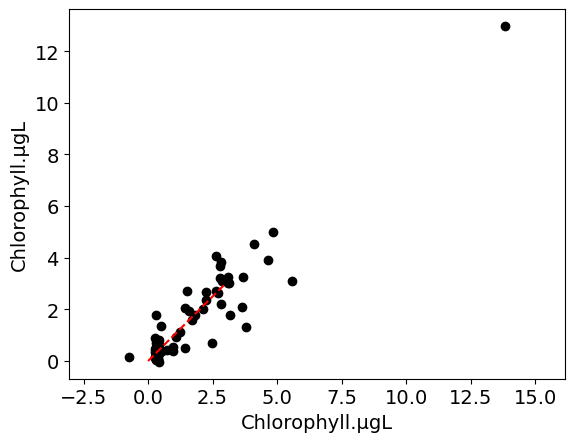

pc
Pearson R (0.8040283926436459, 2.117599075784309e-15)
MAE 0.22114395217072455
R-square 0.637279105359476


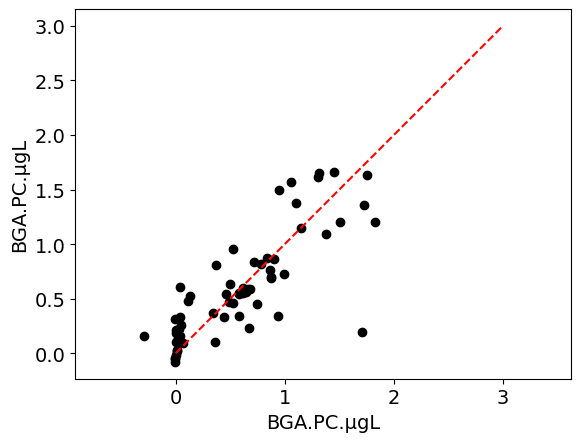

pcchl
Pearson R (0.9359780888475129, 2.3919178332491255e-29)
MAE 0.12703707713427223
R-square 0.8727819436397748


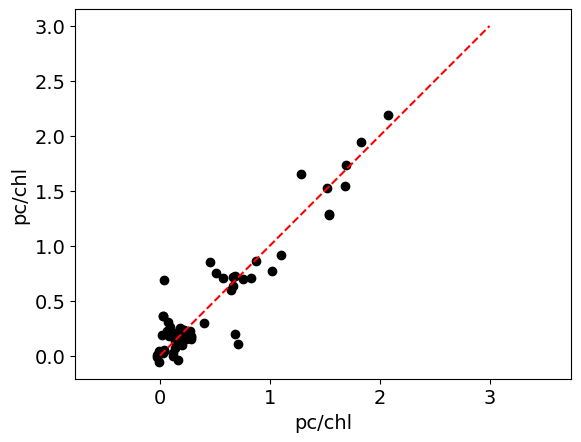

In [50]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasRegressor
from keras.models import Sequential
from keras.layers import Dense

ann_testout = {}
ann_predout = {}

for predictand in predictands:
    
    X_test = Xtest_dict[predictand]
    X_train = Xtrain_dict[predictand]

    Y_test = Ytest_dict[predictand]
    Y_train = Ytrain_dict[predictand]

    np.random.seed(5)
    if predictand == 'BGA.PC.µgL':
        #final model, all features, Best Accuracy for -0.1194 using {'batch_size': 20, 'epochs': 500, 'init': 'normal'}
        #Final model, feature selection, Accuracy for -0.122 using {'batch_size': 20, 'epochs': 100, 'init': 'uniform'}
        print('pc')
        model = Sequential()
        model.add(Dense(128, input_dim=len(X_train[best].columns), kernel_initializer='normal', activation='relu'))
        model.add(Dense(64, kernel_initializer='normal'))
        model.add(Dense(1, kernel_initializer='normal'))
        model.compile(loss='mean_squared_error', optimizer='adam')
        model.fit(X_train[best], Y_train, epochs=100, verbose=0, batch_size=20)
    elif predictand == 'Chlorophyll.µgL':
        #final model, Best Accuracy for -0.8378 using {'batch_size': 10, 'epochs': 300, 'init': 'uniform'}
        #final model, feature selection, Best Accuracy for -1.276 using {'batch_size': 10, 'epochs': 300, 'init': 'uniform'}
        print('chla')
        model = Sequential()
        model.add(Dense(128, input_dim=len(X_train[best].columns), kernel_initializer='uniform', activation='relu'))
        model.add(Dense(64, kernel_initializer='uniform'))
        model.add(Dense(1, kernel_initializer='uniform'))
        model.compile(loss='mean_squared_error', optimizer='adam')
        model.fit(X_train[best], Y_train, epochs=300, verbose=0, batch_size=10)
    elif predictand == 'pc/chl':
        #final model, Best Accuracy for -0.03748 using {'batch_size': 20, 'epochs': 100, 'init': 'uniform'}
        #Final model, feature selection, Best Accuracy for -0.0308 using {'batch_size': 147, 'epochs': 300, 'init': 'normal'}
        print('pcchl')
        model = Sequential()
        model.add(Dense(128, input_dim=len(X_train[best].columns), kernel_initializer='normal', activation='relu'))
        model.add(Dense(64, kernel_initializer='uniform'))
        model.add(Dense(1, kernel_initializer='uniform'))
        model.compile(loss='mean_squared_error', optimizer='adam')
        model.fit(X_train[best], Y_train, epochs=300, verbose=0, batch_size=147)
    
        
    y_pred = model.predict(X_test[best])
    y_pred=y_pred.squeeze()
    print('Pearson R',pearsonr(Y_test, y_pred)) #r, p
    print('MAE',mean_absolute_error(Y_test,y_pred))
    print('R-square',r2_score(Y_test,y_pred))
    
    
    ann_testout[predictand] = Y_test
    ann_predout[predictand] = y_pred

    xy_line = (0,1,2,3)
    plt.plot(xy_line, 'r--')
    plt.scatter(Y_test,y_pred,facecolor="black")
    plt.axis('equal')
    plt.xlabel(predictand)
    plt.ylabel(predictand)
    #plt.title('Sentinel 2, Random Forest')
    plt.show()

Cross Validation ANN Models

chla
chla
chla
chla
chla
Fold Average Pearson R 0.32337175917387995
Fold Average R-square 0.3022236973389413
Fold Average MAE 0.9919671245346665
pc
pc
pc
pc
pc
Fold Average Pearson R 0.393608468164003
Fold Average R-square 0.5689933579592558
Fold Average MAE 0.2514699587926241
pcchl
pcchl
pcchl
pcchl
pcchl
Fold Average Pearson R 0.43016814222935806
Fold Average R-square 0.6878204547610582
Fold Average MAE 0.17365774642886958


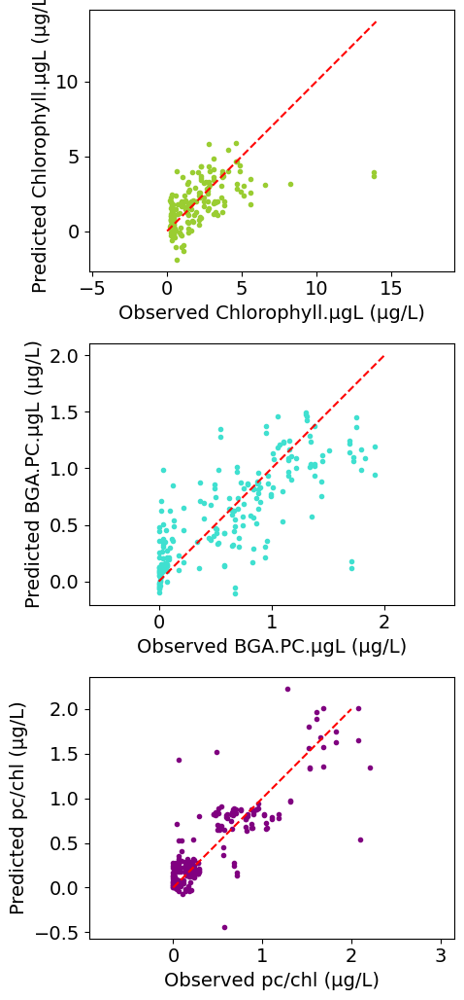

In [10]:
from sklearn.model_selection import RepeatedKFold
from itertools import chain
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from keras.wrappers.scikit_learn import KerasRegressor
from keras.models import Sequential
from keras.layers import Dense

odo, grid = merge['ODO.mg.L'], merge['Grid']

ann_testout = {}
ann_predout = {}
ann_gridout = {}

modelType = ['chl','pc','pcchl']

predictand_names = ['Chlorophyll.µgL','BGA.PC.µgL',"pc/chl"]
cols = ['yellowgreen','turquoise','purple']
num=[0,1,2]
lims = [range(0,15),range(0,3),range(0,3)]

fig, axs = plt.subplots(nrows=3, ncols=1)
fig.set_size_inches(5, 10.5, forward=True)
axs=axs.flatten()

random_state = 42

for predictand, i in zip(predictands, num):
    
    best = bestPreds[i]
    
    #Scale data
    scaler = StandardScaler()
    scaler.fit(X)
    Xsc=scaler.transform(X)

    Xsc = pd.DataFrame(Xsc)
    Xsc.columns = X.columns

    kfoldPreds, fold = [], []
    
    r2ANN, pr, mae=[],[],[]
    
    predsANN=pd.DataFrame({'test' : [],'pred' : []})

    
    odo_cv_ann=pd.DataFrame({'ODO.mg.L' : []})
    grid_cv_ann=pd.DataFrame({'Grid' : []})
    
    
    
    rkf = RepeatedKFold(n_splits=splits, n_repeats=1, random_state=random_state)
    for j,(train, test) in enumerate(rkf.split(Xsc)):

        Y = merge[predictand]
        
        X_train, X_test, Y_train, Y_test, odo_test, grid_test = Xsc.iloc[train], Xsc.iloc[test], Y.iloc[train], Y.iloc[test], odo.iloc[test], grid.iloc[test]

        
        #Build models
        if predictand == 'BGA.PC.µgL':
            #final model, all features, Best Accuracy for -0.1194 using {'batch_size': 20, 'epochs': 500, 'init': 'normal'}
            #Final model, feature selection, Accuracy for -0.122 using {'batch_size': 20, 'epochs': 100, 'init': 'uniform'}
            print('pc')
            model = Sequential()
            model.add(Dense(128, input_dim=len(X_train[best].columns), kernel_initializer='normal', activation='relu'))
            model.add(Dense(64, kernel_initializer='normal'))
            model.add(Dense(32, kernel_initializer='normal'))
            model.add(Dense(1, kernel_initializer='normal'))
            model.compile(loss='mean_squared_error', optimizer='adam')
            model.fit(X_train[best], Y_train, epochs=100, verbose=0, batch_size=20)
        elif predictand == 'Chlorophyll.µgL':
            #final model, Best Accuracy for -0.8378 using {'batch_size': 10, 'epochs': 300, 'init': 'uniform'}
            #final model, feature selection, Best Accuracy for -1.276 using {'batch_size': 10, 'epochs': 300, 'init': 'uniform'}
            print('chla')
            model = Sequential()
            model.add(Dense(128, input_dim=len(X_train[best].columns), kernel_initializer='uniform', activation='relu'))
            model.add(Dense(64, kernel_initializer='uniform'))
            model.add(Dense(32, kernel_initializer='normal'))
            model.add(Dense(1, kernel_initializer='uniform'))
            model.compile(loss='mean_squared_error', optimizer='adam')
            model.fit(X_train[best], Y_train, epochs=300, verbose=0, batch_size=10)
        elif predictand == 'pc/chl':
            #final model, Best Accuracy for -0.03748 using {'batch_size': 20, 'epochs': 100, 'init': 'uniform'}
            #Final model, feature selection, Best Accuracy for -0.0308 using {'batch_size': 147, 'epochs': 300, 'init': 'normal'}
            print('pcchl')
            model = Sequential()
            model.add(Dense(128, input_dim=len(X_train[best].columns), kernel_initializer='normal', activation='relu'))
            model.add(Dense(64, kernel_initializer='uniform'))
            model.add(Dense(1, kernel_initializer='uniform'))
            model.compile(loss='mean_squared_error', optimizer='adam')
            model.fit(X_train[best], Y_train, epochs=300, verbose=0, batch_size=147)
            
        
        
        #Predict
        y_pred = model.predict(X_test[best])
        y_pred=y_pred.squeeze()
        
        foldResults=pd.DataFrame(zip(Y_test,y_pred), columns = ['test','pred'])
        
        #Get scores for each fold
        fold.append([j]*len(X_test))
        pr.append(pearsonr(Y_test,y_pred))
        r2ANN.append(r2_score(Y_test,y_pred))
        mae.append(mean_absolute_error(Y_test,y_pred))
    
        #Save outputs
        odo_cv_ann=pd.concat([odo_cv_ann,pd.DataFrame(odo_test)],axis=0) #to keep track of data pairs
        grid_cv_ann=pd.concat([grid_cv_ann,pd.DataFrame(grid_test)],axis=0) #to keep track of data pairs
        predsANN=pd.concat([predsANN,foldResults],axis=0)
    
    
    bestPreds.append(best)
    xy_line = lims[i]
    axs[i].plot(xy_line, 'r--')
    axs[i].scatter(predsANN['test'],predsANN['pred'], s=9, facecolor=cols[i])
    #axs[i].scatter(predsRF['test'],predsRF['pred'], s=9,c=np.array(list(chain(*fold))))
    axs[i].axis('equal')
    axs[i].set_xlabel('Observed'+' '+Y.name+' '+'(µg/L)')
    axs[i].set_ylabel('Predicted'+' '+Y.name+' '+'(µg/L)')
    

    print('Fold Average Pearson R',np.mean(pr)) #r, p
    print('Fold Average R-square',np.mean(r2ANN))
    print('Fold Average MAE',np.mean(mae))

    #joblib.dump(rfr, modelType[i]+"_rf.joblib")
    
    bestPreds.append(best)
    predsANN
    
    ann_testout[predictand_names[i]] = predsANN['test']
    ann_predout[predictand_names[i]] = predsANN['pred']
    ann_gridout[predictand_names[i]] = grid_cv_ann['Grid']

fig.tight_layout()
plt.show()




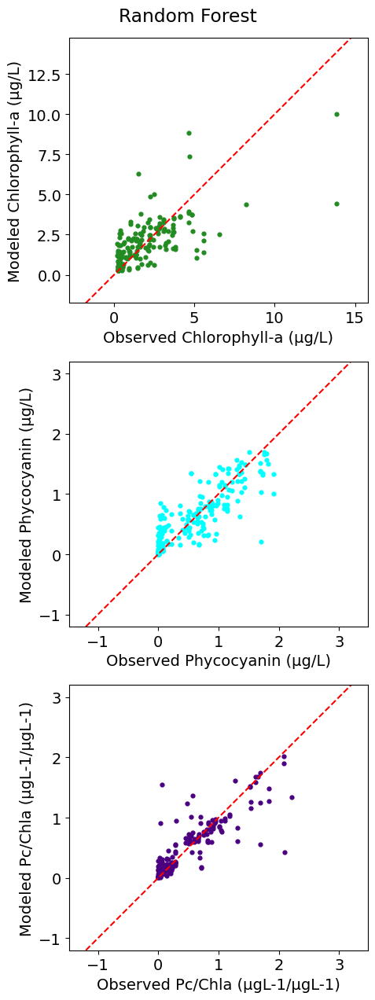

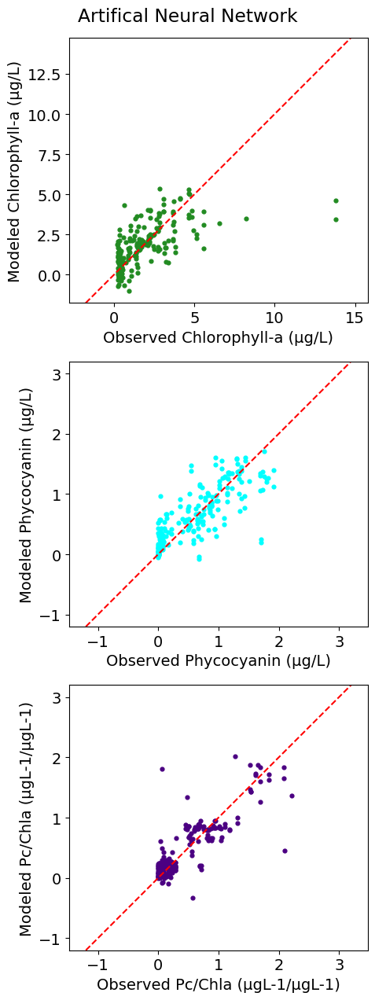

In [13]:
#Figures

import scipy.stats

# Styling
plt.style.use("default")
#plt.rcParams["font.family"] = "times"
plt.rcParams["font.size"] = 14


#RF

# Create Blank Figure
fig = plt.figure(figsize=(5, 13))
# Create 4x4 Grid
#gs = fig.add_gridspec(nrows=3, ncols=1, height_ratios=[2, 1], width_ratios=[2, 1])
gs = fig.add_gridspec(nrows=3, ncols=1)

# Create Three Axes Objects
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[2, 0])


# Plot Data
xy_line = range(0,14)
ax1.scatter(rf_testout['Chlorophyll.µgL'],rf_predout['Chlorophyll.µgL'], color="forestgreen", linewidth=1,s=12)
ax1.axline((-1,-1),(14,14), linestyle='--',color='red')
ax1.set_xlabel('Observed Chlorophyll-a (µg/L)')
ax1.set_ylabel('Modeled Chlorophyll-a (µg/L)')
ax1.axis('equal')
#ax1.set_xlim([0,14])
#ax1.set_ylim([0,14])

xy_line = range(0,4)
ax2.scatter(rf_testout['BGA.PC.µgL'],rf_predout['BGA.PC.µgL'], color="cyan", linewidth=1,s=12)
ax2.axline((-1,-1),(3,3), linestyle='--',color='red')
ax2.set_xlabel('Observed Phycocyanin (µg/L)')
ax2.set_ylabel('Modeled Phycocyanin (µg/L)')
ax2.axis('equal')
#ax2.set_xlim([0,3])
#ax2.set_ylim([0,3])


xy_line = range(0,4)
ax3.scatter(rf_testout['pc/chl'],rf_predout['pc/chl'], color="indigo",s=12)
ax3.axline((-1,-1),(3,3), linestyle='--',color='red')
ax3.set_xlabel('Observed Pc/Chla (µgL-1/µgL-1)')
ax3.set_ylabel('Modeled Pc/Chla (µgL-1/µgL-1)')
ax3.axis('equal')
#ax3.set_xlim([0,4])
#ax3.set_ylim([0,4])

fig.suptitle("Random Forest")
fig.tight_layout()
plt.show()


#ANN

# Create Blank Figure
fig = plt.figure(figsize=(5, 13))
# Create 4x4 Grid
#gs = fig.add_gridspec(nrows=3, ncols=1, height_ratios=[2, 1], width_ratios=[2, 1])
gs = fig.add_gridspec(nrows=3, ncols=1)

# Create Three Axes Objects
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[1, 0])
ax3 = fig.add_subplot(gs[2, 0])


# Plot Data
xy_line = range(0,14)
ax1.scatter(ann_testout['Chlorophyll.µgL'],ann_predout['Chlorophyll.µgL'], color="forestgreen", linewidth=1,s=12)
ax1.axline((-1,-1),(14,14), linestyle='--',color='red')
ax1.set_xlabel('Observed Chlorophyll-a (µg/L)')
ax1.set_ylabel('Modeled Chlorophyll-a (µg/L)')
ax1.axis('equal')
#ax1.set_xlim([0,14])
#ax1.set_ylim([0,14])

xy_line = range(0,4)
ax2.scatter(ann_testout['BGA.PC.µgL'],ann_predout['BGA.PC.µgL'], color="cyan", linewidth=1,s=12)
ax2.axline((-1,-1),(3,3), linestyle='--',color='red')
ax2.set_xlabel('Observed Phycocyanin (µg/L)')
ax2.set_ylabel('Modeled Phycocyanin (µg/L)')
ax2.axis('equal')
#ax2.set_xlim([0,3])
#ax2.set_ylim([0,3])


xy_line = range(0,4)
ax3.scatter(ann_testout['pc/chl'],ann_predout['pc/chl'], color="indigo",s=12)
#ax3.plot(xy_line, 'r--')
ax3.axline((-1,-1),(3,3), linestyle='--',color='red')
ax3.set_xlabel('Observed Pc/Chla (µgL-1/µgL-1)')
ax3.set_ylabel('Modeled Pc/Chla (µgL-1/µgL-1)')
ax3.axis('equal')
#ax3.set_xlim([0,4])
#ax3.set_ylim([0,4])

fig.suptitle("Artifical Neural Network")
fig.tight_layout()
plt.show()




### Final Models for each variable

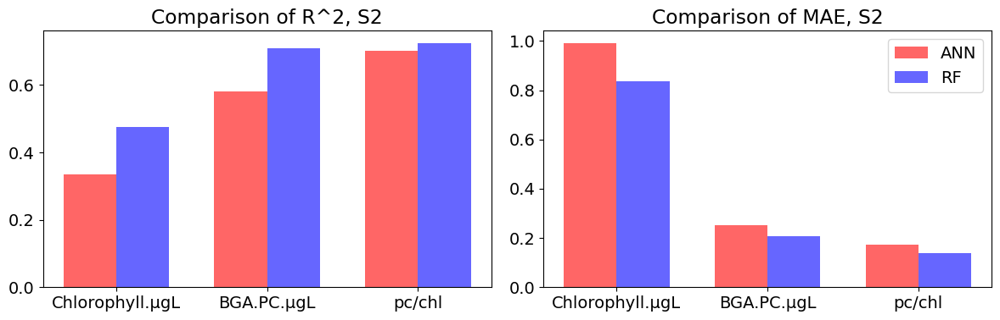

In [11]:

maeANN, r2ANN, maeRF, r2RF, var = [], [], [], [], []
for key in rf_predout:
    r2RF.append(r2_score(rf_testout[key],rf_predout[key]))
    r2ANN.append(r2_score(ann_testout[key],ann_predout[key]))
    
    maeRF.append(mean_absolute_error(rf_testout[key],rf_predout[key]))
    maeANN.append(mean_absolute_error(ann_testout[key],ann_predout[key]))
    
    var.append(key)

  


fig, ax = plt.subplots(1,2)
fig.set_size_inches(12, 4)
ind = np.arange(len(var))
bar_width = 0.35
opacity = 0.6
rects1 = ax[0].bar(ind, r2ANN, bar_width,
                alpha=opacity, color='r')
rects2 = ax[0].bar(ind+bar_width, r2RF, bar_width,
                alpha=opacity, color='b')
ax[0].set_title('Comparison of R^2, S2')
ax[0].set_xticks(ind + bar_width/2)
ax[0].set_xticklabels(var)



rects3 = ax[1].bar(ind, maeANN, bar_width,
                alpha=opacity, color='r', label='ANN')
rects4 = ax[1].bar(ind+bar_width, maeRF, bar_width,
                alpha=opacity, color='b', label='RF')
ax[1].set_title('Comparison of MAE, S2')
ax[1].set_xticks(ind + bar_width/2)
ax[1].set_xticklabels(var)
ax[1].legend()

fig.tight_layout()
plt.show()


r2results=pd.DataFrame(zip(var,r2ANN,r2RF), columns=["var",'ANN','RF'])

names = ['Chlorophyll.µgL_o','Chlorophyll.µgL_p','grid','BGA.PC.µgL_o','BGA.PC.µgL_p','grid','pc/chl_p','pc/chl_o','grid']

chl=pd.DataFrame(zip(pd.DataFrame.from_dict(ann_testout)['Chlorophyll.µgL'], #ANN best for chl
                pd.DataFrame.from_dict(ann_predout)['Chlorophyll.µgL'],
                pd.DataFrame.from_dict(ann_gridout)['Chlorophyll.µgL']),
                columns=names[0:3])



pc=pd.DataFrame(zip(pd.DataFrame.from_dict(rf_testout)['BGA.PC.µgL'], #RF best for pc
                pd.DataFrame.from_dict(rf_predout)['BGA.PC.µgL'],
                pd.DataFrame.from_dict(rf_gridout)['BGA.PC.µgL']),
                columns=names[3:6])

                
pcchl=pd.DataFrame(zip(pd.DataFrame.from_dict(rf_testout)['pc/chl'], #RF best for pc/chl
                pd.DataFrame.from_dict(rf_predout)['pc/chl'],
                pd.DataFrame.from_dict(rf_gridout)['pc/chl']),
                columns=names[6:9])


chl=chl.sort_values(by='grid',ignore_index=True)
pc=pc.sort_values(by='grid',ignore_index=True)
pcchl=pcchl.sort_values(by='grid',ignore_index=True)

algaePreds=pd.concat([chl,pc,pcchl],axis=1)



### Dissolved Oxygen Prediction


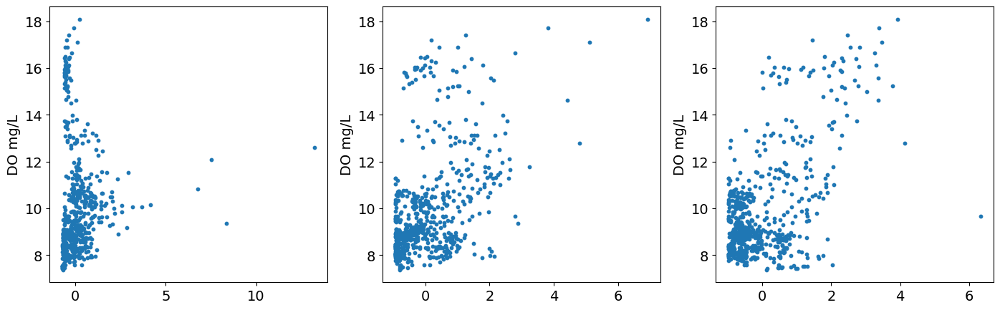

Rsquare ANN RS 0.48771340512336125
Rsquare RF RS 0.4636072945329638
Rsquare ANN RS 0.37523898184540894
Rsquare RF RS 0.4696575884119649
Rsquare ANN RS 0.20616738935749523
Rsquare RF RS 0.47863094145709306
Rsquare ANN RS 0.3977568584285194
Rsquare RF RS 0.5055626735995444
Rsquare ANN RS 0.39887407984885526
Rsquare RF RS 0.4496812105039246
Fold Average Pearson R ANN [0.3505130365642829]
Fold Average R-square ANN 0.45060707295378644
Fold Average MAE ANN 0.9860492166352401
Fold Average Pearson R RF 0.3651906447288682
Fold Average R-square RF 0.5163813407683029
Fold Average MAE RF 0.9127466131991484


/Users/maxbeal/opt/anaconda3/lib/python3.8/site-packages/numpy/core/_methods.py:163: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  arr = asanyarray(a)


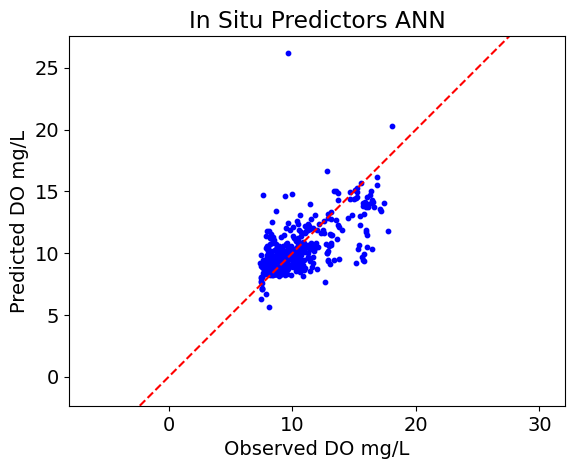

Pearson r explanatory model (array([0.6937025], dtype=float32), 2.0332620064821433e-97)
Rsquare 0.45987727165052017


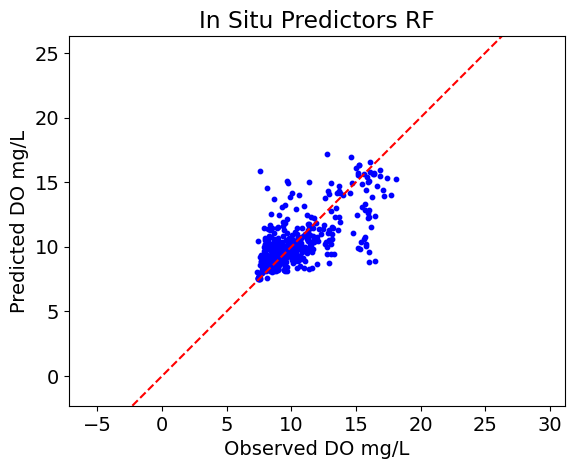

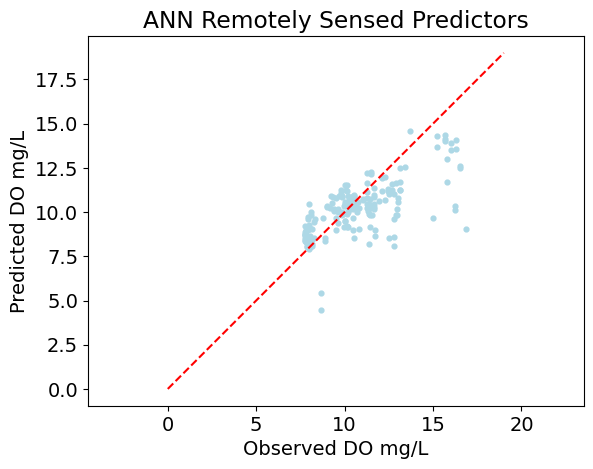

Pearson r explanatory model (0.7326602915399542, 6.153644116007018e-36)
Rsquare 0.4983569355355225
MAE 1.1455465082795009


/Users/maxbeal/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


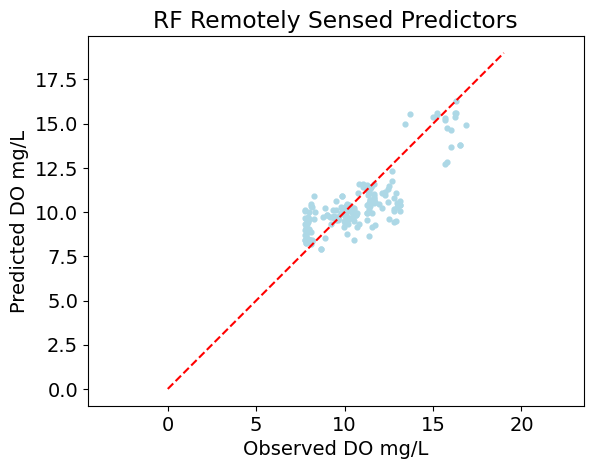

Pearson r explanatory model (0.8499648192924314, 1.0933424300381726e-58)
Rsquare 0.7035784757310581
MAE 0.9733461901159033


In [12]:
import scipy
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from keras.wrappers.scikit_learn import KerasRegressor
from keras.models import Sequential
from keras.layers import Dense
from sklearn.model_selection import cross_val_score


algae=['Chlorophyll.µgL','BGA.PC.µgL','pc/chl']


df2=df2[(df2['Chlorophyll.µgL']>=0) & (df2['BGA.PC.µgL']>=0)]
df2['pc/chl']=df2['BGA.PC.µgL']/df2['Chlorophyll.µgL']

df2.replace([np.inf, -np.inf], np.nan, inplace=True)
df2=df2.dropna(subset=['pc/chl'])

odo = merge['ODO.mg.L']

Y=df2['ODO.mg.L']

scaler = StandardScaler()
scaler.fit(df2[algae])
Xsc=scaler.transform(df2[algae])

Xsc = pd.DataFrame(Xsc)
Xsc.columns = algae



doANN = []
prANN=[]
maeANN=[]

doRF = []
prRF=[]
maeRF=[]


algae_preds=pd.DataFrame(rf_predout)

fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(17,5), sharey=False)
for i,ax in enumerate(axes):
    ax.scatter(Xsc.iloc[:,i],Y,s=10)
    ax.set_ylabel('DO mg/L')
plt.show()



predsANN_DO=pd.DataFrame({'test' : [],'pred' : []})
predsRF_DO=pd.DataFrame({'test' : [],'pred' : []})

#Cross Validation
random_state = 42
rkf = RepeatedKFold(n_splits=5, n_repeats=1, random_state=random_state)
for j,(train, test) in enumerate(rkf.split(Xsc)):

    X_train, X_test, Y_train, Y_test = Xsc.iloc[train], Xsc.iloc[test], Y.iloc[train], Y.iloc[test]


    #ANN models
    input_dim = X_train.shape[1]
    num_classes = 1

    #final model
    model = Sequential()
    model.add(Dense(128, input_dim=len(algae), kernel_initializer='normal', activation='relu'))
    model.add(Dense(64, kernel_initializer='normal'))
    model.add(Dense(1, kernel_initializer='normal'))
    model.compile(loss='mean_squared_error', optimizer='adam')
    model.fit(X_train, Y_train.values.ravel(), epochs=500, verbose=0, batch_size=20)


    #In situ Data
    y_pred = model.predict(X_test)
    foldResults_ANN=pd.DataFrame(zip(Y_test,y_pred), columns = ['test','pred'])
    predsANN_DO=pd.concat([predsANN_DO,foldResults_ANN],axis=0)

    fold.append([j]*len(X_test))
    prANN.append(pearsonr(Y_test,y_pred))
    doANN.append(r2_score(Y_test,y_pred))
    maeANN.append(mean_absolute_error(Y_test,y_pred))

    
    rfr = RandomForestRegressor(n_estimators = 1000)
    rfr.fit(X_train, Y_train.values.ravel())
    y_pred = rfr.predict(X_test)
    
    prRF.append(pearsonr(Y_test,y_pred))
    doRF.append(r2_score(Y_test,y_pred))
    maeRF.append(mean_absolute_error(Y_test,y_pred))
    foldResults_RF=pd.DataFrame(zip(Y_test,y_pred), columns = ['test','pred'])
    predsRF_DO=pd.concat([predsRF_DO,foldResults_RF],axis=0)
    
    
    test=pd.DataFrame(scaler.transform(algae_preds))
    test.columns = algae_preds.columns
    #RS data
    odopred_rs = model.predict(test)
    print('Rsquare ANN RS',r2_score(odo_cv_rf,odopred_rs))
    odopred_rs = rfr.predict(test)
    print('Rsquare RF RS',r2_score(odo_cv_rf,odopred_rs ))
    
    

    

print('Fold Average Pearson R ANN',np.mean(prANN)) #r, p
print('Fold Average R-square ANN',np.mean(doANN))
print('Fold Average MAE ANN',np.mean(maeANN))
    
print('Fold Average Pearson R RF',np.mean(prRF)) #r, p
print('Fold Average R-square RF',np.mean(doRF))
print('Fold Average MAE RF',np.mean(maeRF))  



plt.axline((-1,-1),(25,25),linestyle='--',color='red')
plt.scatter(predsANN_DO['test'],predsANN_DO['pred'], color="blue",s=10)
plt.xlabel('Observed DO mg/L')
plt.ylabel('Predicted DO mg/L')
plt.axis('equal')
plt.title('In Situ Predictors ANN')

plt.show()
print('Pearson r explanatory model',scipy.stats.pearsonr(predsANN_DO['test'],predsANN_DO['pred']))
print('Rsquare',r2_score(predsANN_DO['test'],predsANN_DO['pred']))


plt.axline((-1,-1),(25,25),linestyle='--',color='red')
plt.scatter(predsRF_DO['test'],predsRF_DO['pred'], color="blue",s=10)
plt.xlabel('Observed DO mg/L')
plt.ylabel('Predicted DO mg/L')
plt.axis('equal')
plt.title('In Situ Predictors RF')

plt.show()






#Remotely Sensed

predout=algaePreds[['Chlorophyll.µgL_p','BGA.PC.µgL_p','pc/chl_p']]

scaler = StandardScaler()
scaler.fit(pd.DataFrame(predout))
algae_preds=scaler.transform(pd.DataFrame(predout))

#Sort odo by grid num
odoObs=pd.concat((odo_cv_rf,grid_cv_rf),axis=1)
odoObs.sort_values(by='Grid',inplace=True)


odopred_rs = model.predict(algae_preds)

xy_line = range(0,20)
plt.plot(xy_line, 'r--')
plt.scatter(odoObs['ODO.mg.L'],odopred_rs.squeeze(), color="lightblue",s=12)
plt.xlabel('Observed DO mg/L')
plt.ylabel('Predicted DO mg/L')
plt.axis('equal')
plt.title('ANN Remotely Sensed Predictors')
plt.show()
print('Pearson r explanatory model',scipy.stats.pearsonr(odopred_rs.squeeze(),odoObs['ODO.mg.L']))
print('Rsquare',r2_score(odoObs['ODO.mg.L'],odopred_rs))
print('MAE',mean_absolute_error(odoObs['ODO.mg.L'],odopred_rs))

odopred_rs = rfr.predict(algae_preds)

xy_line = range(0,20)
plt.plot(xy_line, 'r--')
plt.scatter(odoObs['ODO.mg.L'],odopred_rs, color="lightblue",s=12)
plt.xlabel('Observed DO mg/L')
plt.ylabel('Predicted DO mg/L')
plt.axis('equal')
plt.title('RF Remotely Sensed Predictors')
plt.show()
print('Pearson r explanatory model',scipy.stats.pearsonr(odopred_rs.squeeze() ,odoObs['ODO.mg.L']))
print('Rsquare',r2_score(odoObs['ODO.mg.L'],odopred_rs))
print('MAE',mean_absolute_error(odoObs['ODO.mg.L'],odopred_rs))



#Combine predictions and observations, sorted by Grid (above) and add them onto the algaePreds df
odoPred=pd.DataFrame(odopred_rs)
odoPred.reset_index(drop=True,inplace=True)
odoObs.reset_index(drop=True,inplace=True)
odoOut=pd.concat((odoObs['ODO.mg.L'],odoPred,odoObs['Grid']),axis=1,ignore_index=True)


odoOut.columns = ['odo_o','odo_p','grid']



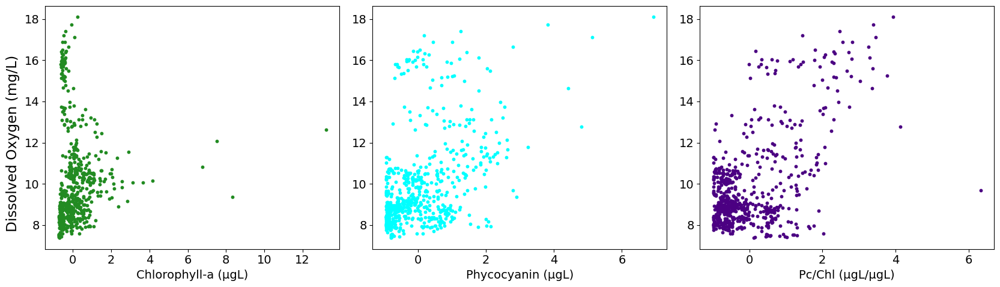

Elapsed time to compute the importances: 4.394 seconds


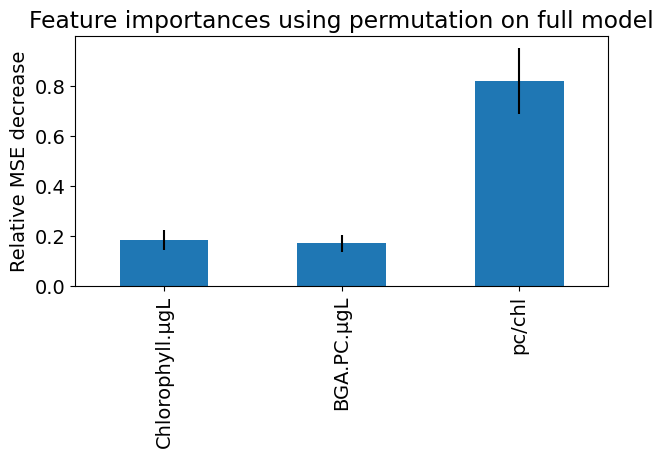

In [13]:
plt.rcParams["font.size"] = 14
cols = ['forestgreen','cyan','indigo']
xlabs= ['Chlorophyll-a (µgL)','Phycocyanin (µgL)','Pc/Chl (µgL/µgL)']
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(17,5), sharey=False)
for i,ax in enumerate(axes):
    ax.scatter(Xsc.iloc[:,i],Y,s=10, color=cols[i])
    #ax.set_ylabel('Dissolved Oxygen (mg/L)')
    ax.set_xlabel(xlabs[i])
fig.supylabel('Dissolved Oxygen (mg/L)')
fig.tight_layout()
plt.show()


from sklearn.inspection import permutation_importance
import time

start_time = time.time()
result = permutation_importance(
    rfr, X_test, Y_test, n_repeats=10, random_state=42, n_jobs=2
)
elapsed_time = time.time() - start_time
print(f"Elapsed time to compute the importances: {elapsed_time:.3f} seconds")

forest_importances = pd.Series(result.importances_mean, index=algae)


fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=result.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Relative MSE decrease")
fig.tight_layout()
plt.show()

ODO plots

/Users/maxbeal/opt/anaconda3/lib/python3.8/site-packages/sklearn/base.py:450: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


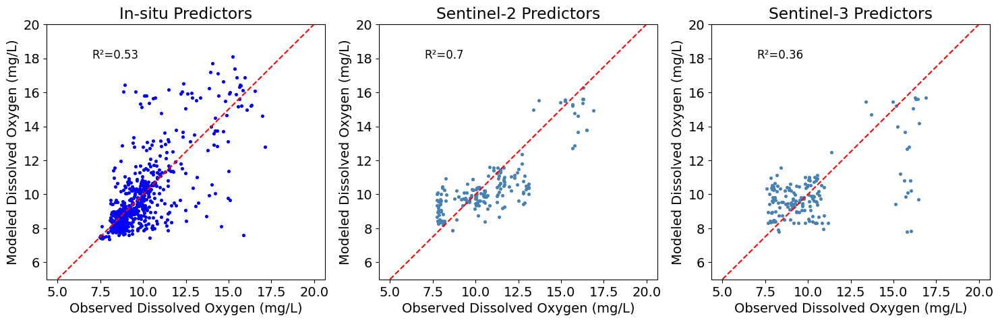

MAE RF in situ 0.9127537732696857
MAE S2 0.9733461901159033
MAE S3 1.3694406368772136


In [14]:
plt.rcParams["font.size"] = 14

odopred_rs = rfr.predict(algae_preds)

s3=pd.read_csv("/Users/maxbeal/Desktop/S3ODO_RF.csv")


# Create Blank Figure
fig = plt.figure(figsize=(15, 9))
# Create 4x4 Grid
#gs = fig.add_gridspec(nrows=3, ncols=1, height_ratios=[2, 1], width_ratios=[2, 1])
gs = fig.add_gridspec(nrows=2, ncols=3)


ax4 = fig.add_subplot(gs[1, 0])
ax5 = fig.add_subplot(gs[1, 1])
ax6 = fig.add_subplot(gs[1, 2])


ax4.axline((0,0),(25,25),linestyle='--',color='red')
ax4.scatter(predsRF_DO['pred'],predsRF_DO['test'], color="blue",s=7)
ax4.set_xlabel('Observed Dissolved Oxygen (mg/L)')
ax4.set_ylabel('Modeled Dissolved Oxygen (mg/L)')
ax4.axis('equal')
ax4.set_title('In-situ Predictors')
ax4.text(7, 18, 'R²=%s' % round(r2_score(predsRF_DO['test'],predsRF_DO['pred']),2), fontsize=12)
ax4.set_xlim([5,20])
ax4.set_ylim([5,20])

ax5.axline((0,0),(25,25),linestyle='--',color='red')
ax5.scatter(odoObs['ODO.mg.L'],odopred_rs, color="steelblue", s=7)
ax5.set_xlabel('Observed Dissolved Oxygen (mg/L)')
ax5.set_ylabel('Modeled Dissolved Oxygen (mg/L)')
ax5.axis('equal')
ax5.set_title('Sentinel-2 Predictors')
ax5.text(7, 18, 'R²=%s' % round(r2_score(odoObs['ODO.mg.L'],odopred_rs),2), fontsize=12)
ax5.set_xlim([5,20])
ax5.set_ylim([5,20])

ax6.axline((0,0),(25,25),linestyle='--',color='red')
ax6.scatter(s3['ODO_obs'],s3['ODO_pred'], color="steelblue", s=7)
ax6.set_xlabel('Observed Dissolved Oxygen (mg/L)')
ax6.set_ylabel('Modeled Dissolved Oxygen (mg/L)')
ax6.axis('equal')
ax6.set_title('Sentinel-3 Predictors')
ax6.text(7, 18, 'R²=%s' % round(r2_score(s3['ODO_obs'],s3['ODO_pred']),2), fontsize=12)
ax6.set_xlim([5,20])
ax6.set_ylim([5,20])

fig.tight_layout()
plt.show()


print('MAE RF in situ',mean_absolute_error(predsRF_DO['test'],predsRF_DO['pred']))
print('MAE S2',mean_absolute_error(odoObs['ODO.mg.L'],odopred_rs))
print('MAE S3',mean_absolute_error(s3['ODO_obs'],s3['ODO_pred']))


## Investigate Error in predictions by grid

float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64
float64


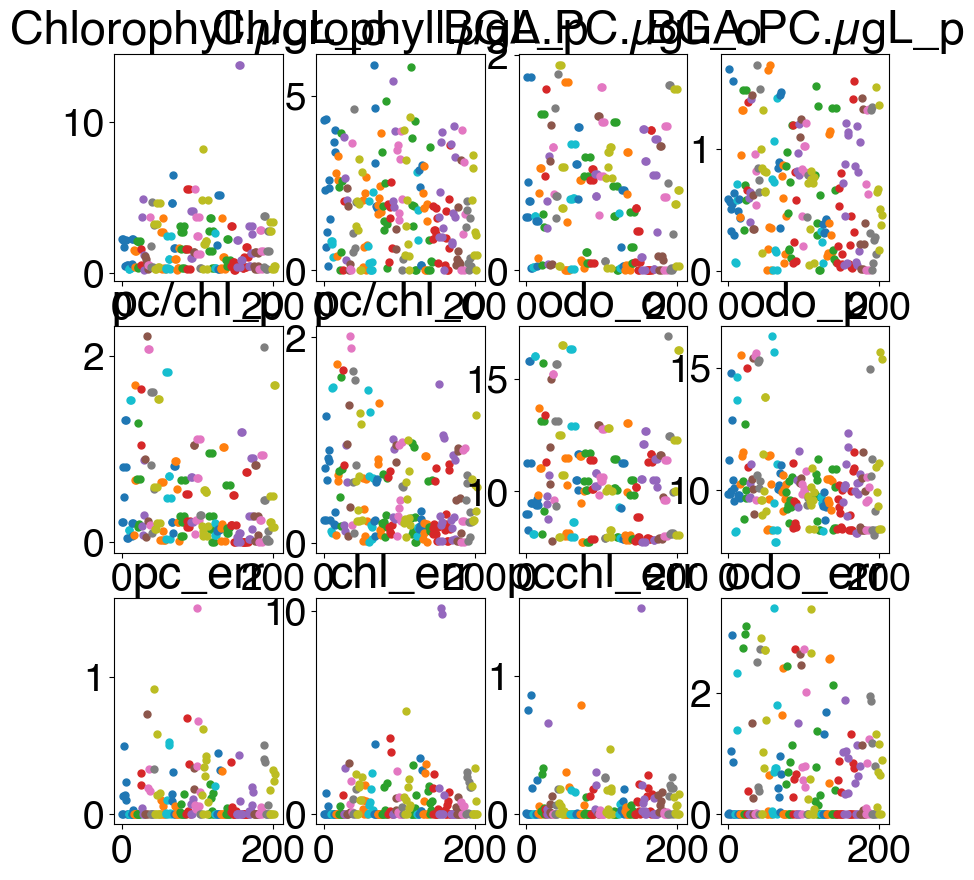

Chlorophyll.µgL_o    float64
Chlorophyll.µgL_p    float64
grid                 float64
BGA.PC.µgL_o         float64
BGA.PC.µgL_p         float64
                      ...   
odo_p                float64
pc_err               float64
chl_err              float64
pcchl_err            float64
odo_err              float64
Length: 13, dtype: object

In [25]:

obs_preds_all=pd.concat((algaePreds,odoOut),axis=1)
obs_preds_all=obs_preds_all.T.drop_duplicates().T

obs_preds_all=obs_preds_all[obs_preds_all['grid']!='DH']





#Calculate Errors
obs_preds_all['pc_err'] = obs_preds_all['BGA.PC.µgL_o'] - obs_preds_all['BGA.PC.µgL_p']
obs_preds_all['chl_err'] = obs_preds_all['Chlorophyll.µgL_o'] - obs_preds_all['Chlorophyll.µgL_p']
obs_preds_all['pcchl_err'] = obs_preds_all['pc/chl_o'] - obs_preds_all['pc/chl_p']
obs_preds_all['odo_err'] = obs_preds_all['odo_o'] - obs_preds_all['odo_p']

#set values less than zero to zero
num_names = ['BGA.PC.µgL_p','Chlorophyll.µgL_p','pc/chl_p','odo_p','grid','BGA.PC.µgL_o','Chlorophyll.µgL_o','pc/chl_o','odo_o','pc_err','chl_err','pcchl_err','odo_err']
for name in num_names:
    obs_preds_all[name] = obs_preds_all[name].astype(float)
    
    obs_preds_all[name] = pd.to_numeric(obs_preds_all[name])
    obs_preds_all.loc[obs_preds_all[name] < 0, name] = 0
    
    print(obs_preds_all[name].dtypes)
   

#Line plots
nrows = 3
ncols = 4

fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10,10), sharey=False)
plotnames = obs_preds_all.columns
plotnames = plotnames[plotnames!="grid"]
for i, ax in enumerate(axes.flatten()):
    grouped = obs_preds_all.groupby('grid')[plotnames[i]].plot(legend=False,ax=ax, marker='o', linestyle='none', markersize=5)
    ax.set_title(plotnames[i])
    
plt.show()

obs_preds_all.dtypes

Boxplots

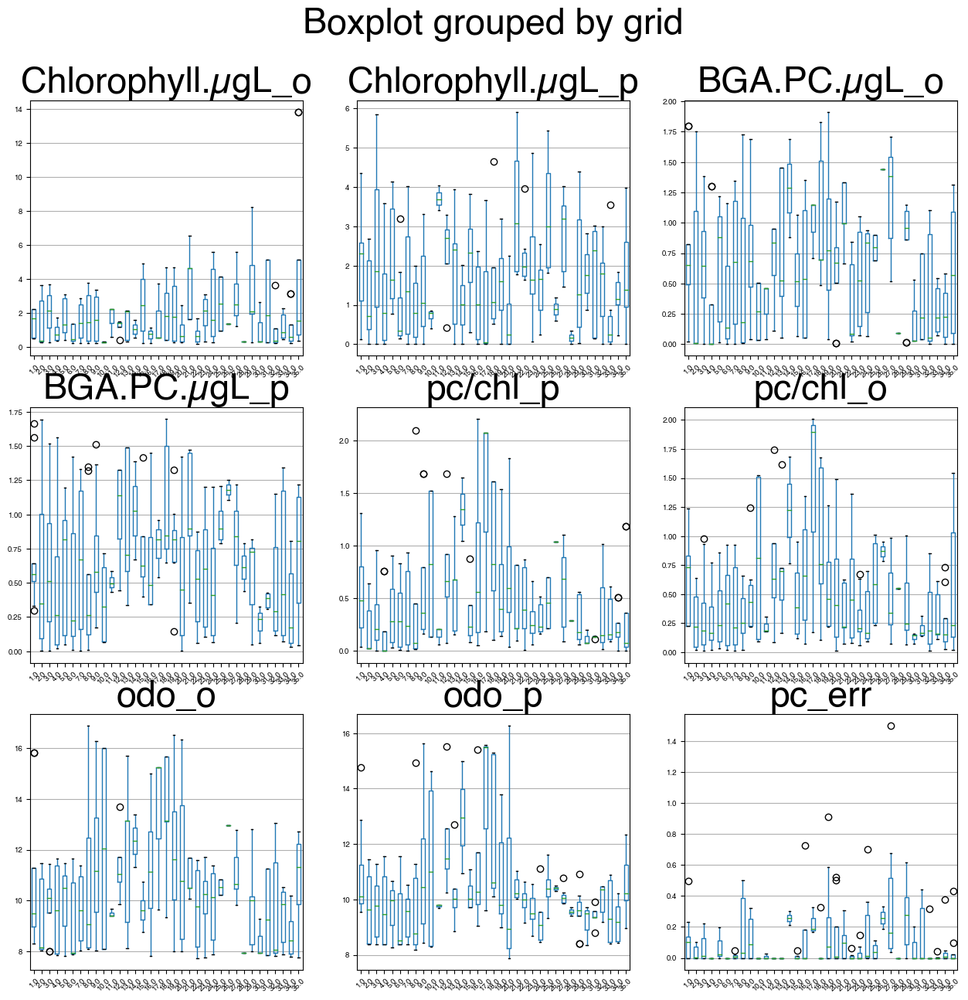

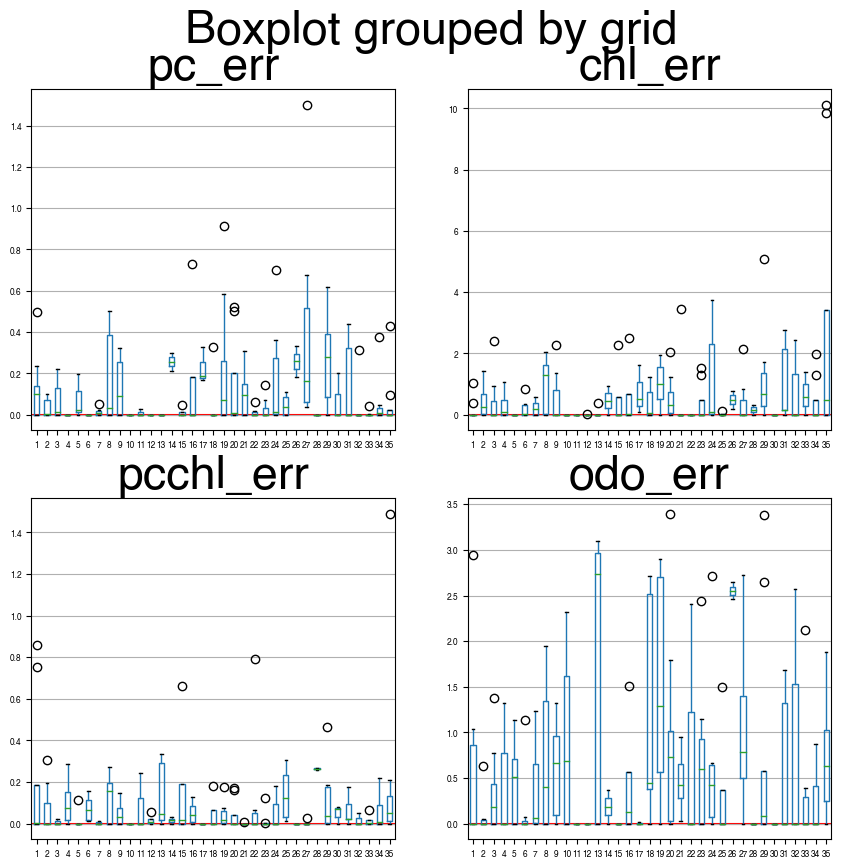

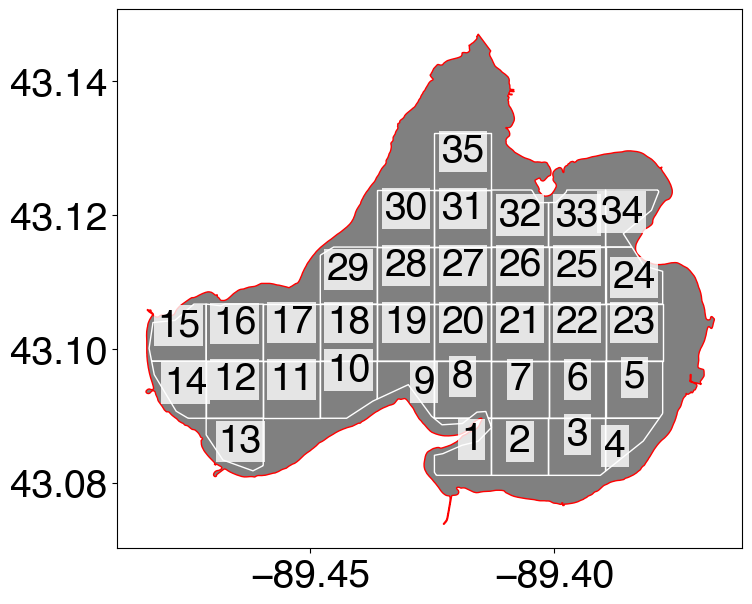

In [26]:
grid_nums = pd.to_numeric(pd.unique(obs_preds_all['grid']),downcast='integer')
grid_nums = grid_nums[~np.isnan(grid_nums)]
grid_nums.sort()


obs_preds_all['grid'] = pd.to_numeric(obs_preds_all['grid'])



#Whisker plots all
nrows = 3
ncols = 3
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,15), sharey=False)
plotnames = obs_preds_all.columns
plotnames = plotnames[plotnames!="grid"]
for i, ax in enumerate(axes.flatten()):
    obs_preds_all.boxplot(column=[plotnames[i]], by='grid', ax=ax,fontsize=7,rot=45)
    ax.set_xlabel("")
    ax.xaxis.grid(False)
plt.show()




#Whisker plots error
nrows = 2
ncols = 2
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(10,10), sharey=False)
plotnames = obs_preds_all.columns
plotnames = plotnames[plotnames!="grid"]

for i, ax in enumerate(axes.flatten()):
        obs_preds_all.boxplot(column=[plotnames[i+8]], by='grid', ax=ax,fontsize=6,rot=0)
        ax.axhline(y=0, color='r', linestyle='-',zorder=0)
        ax.xaxis.grid(False)
        ax.set_xlabel("")
        ax.set_xticklabels(grid_nums.astype(int))


    
plt.show()

#Representative point returns a cheaply computed point that is guaranteed to be within the geometric object. Good for labels.
gridshp['coords'] = gridshp['geometry'].apply(lambda x: x.representative_point().coords[:])
gridshp['coords'] = [coords[0] for coords in gridshp['coords']]

fig, ax = plt.subplots(figsize=(10,7))
mendota.plot(ax=ax,edgecolor="r",facecolor="gray")
gridshp.plot(ax=ax,edgecolor='white',facecolor="none")
for idx, row in gridshp.iterrows():
    plt.annotate(text=row['ID'], xy=row['coords'],
                 horizontalalignment='center', 
                 bbox={'facecolor': 'white', 'alpha':0.8, 'pad': 2, 'edgecolor':'none'})


Add means and error metrics to shapefile and plot

,grid,left,top,right,bottom,...,chl_err,pcchl_err,odo_err,geometry,coords
0,1.0,-89.424566,43.089619,-89.412888,43.081090,...,0.154300,0.200826,0.541034,"MULTIPOLYGON (((-89.42416 43.08109, -89.42457 ...",POINT (-89.41688 43.08495)
1,2.0,-89.412888,43.089619,-89.401210,43.081090,...,0.441052,0.071332,0.101347,"POLYGON ((-89.41289 43.08824, -89.41287 43.088...",POINT (-89.40705 43.08467)
2,3.0,-89.401210,43.089619,-89.389531,43.081090,...,0.453579,0.005895,0.355382,"POLYGON ((-89.38953 43.08172, -89.39062 43.081...",POINT (-89.39537 43.08567)
3,4.0,-89.389531,43.089619,-89.377853,43.081090,...,0.291724,0.099387,0.364995,"POLYGON ((-89.37854 43.08962, -89.38182 43.086...",POINT (-89.38760 43.08397)
4,5.0,-89.389531,43.098147,-89.377853,43.089619,...,0.000000,0.016251,0.437367,"POLYGON ((-89.37785 43.09033, -89.37854 43.089...",POINT (-89.38369 43.09424)
...,...,...,...,...,...,...,...,...,...,...,...
30,31.0,-89.424566,43.123723,-89.412888,43.115199,...,1.040565,0.064155,0.601539,"POLYGON ((-89.42457 43.12372, -89.41289 43.123...",POINT (-89.41873 43.11946)
31,32.0,-89.412888,43.123723,-89.401210,43.115199,...,0.729130,0.015718,0.804750,"POLYGON ((-89.40464 43.12372, -89.40312 43.121...",POINT (-89.40705 43.11851)
32,33.0,-89.401210,43.123723,-89.389531,43.115199,...,0.645096,0.015370,0.419282,"POLYGON ((-89.40121 43.12184, -89.39969 43.121...",POINT (-89.39537 43.11852)
33,34.0,-89.389531,43.123723,-89.377853,43.115199,...,0.437227,0.052574,0.223434,"POLYGON ((-89.37881 43.12372, -89.37866 43.123...",POINT (-89.38628 43.11894)


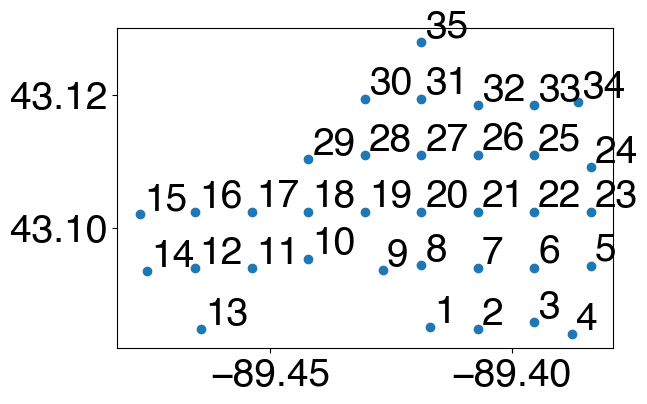

In [28]:
gridshp=gridshp[gridshp['ID']!="DH"]
gridshp["ID"] = pd.to_numeric(gridshp["ID"])
gridshp = gridshp.sort_values(by=["ID"],ignore_index=True)
geom = gridshp['geometry']

gridshp2=gridshp.merge(obs_preds_all, left_on='ID', right_on='grid')


gridshp_grouped = gridshp2.groupby(['ID'])

gridshp_f = gridshp2.groupby(['grid']).mean()

gridshp_f.reset_index(inplace=True)
gridshp_f['geometry'] = geom



#Representative point returns a cheaply computed point that is guaranteed to be within the geometric object. Good for labels.
gridshp_f['coords'] = gridshp_f['geometry'].representative_point()
#gridshp_f['coords'] = [coords for coords in gridshp_f['coords']]


ax = gridshp_f['coords'].plot()
for x, y, label in zip(gridshp_f.coords.x, gridshp_f.coords.y, gridshp_f['ID']):
    ax.annotate(label, xy=(x, y), xytext=(3, 3), textcoords="offset points")
    
gridshp_f.sort_values(by="ID")



In [29]:
from sklearn.metrics import mean_squared_error
obsnames = ['BGA.PC.µgL_o', 'Chlorophyll.µgL_o', 'pc/chl_o', 'odo_o',]
prednames = ['BGA.PC.µgL_p', 'Chlorophyll.µgL_p', 'pc/chl_p', 'odo_p',]
outnames = ['mae_pc', 'mae_chl', 'mae_pcchl','mae_odo']

store=pd.DataFrame(columns=outnames)

for i, name in enumerate(obsnames):
    mae_by_id = gridshp_grouped[obsnames[i], prednames[i]].apply(lambda x: np.mean(np.abs(x[obsnames[i]] - x[prednames[i]])))
    store[outnames[i]] = mae_by_id

    
store['ID'] = gridshp_f['grid']
store.reset_index(inplace=True,drop=True)

for i in outnames:
    gridshp_f[i] = store[i]
    


<ipython-input-29-6eaaf60cac13>:9: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  mae_by_id = gridshp_grouped[obsnames[i], prednames[i]].apply(lambda x: np.mean(np.abs(x[obsnames[i]] - x[prednames[i]])))
<ipython-input-29-6eaaf60cac13>:9: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  mae_by_id = gridshp_grouped[obsnames[i], prednames[i]].apply(lambda x: np.mean(np.abs(x[obsnames[i]] - x[prednames[i]])))
<ipython-input-29-6eaaf60cac13>:9: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  mae_by_id = gridshp_grouped[obsnames[i], prednames[i]].apply(lambda x: np.mean(np.abs(x[obsnames[i]] - x[prednames[i]])))
<ipython-input-29-6eaaf60cac13>:9: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a li

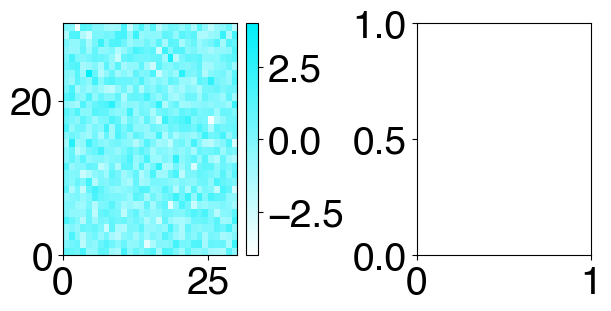

In [30]:
#Create colormap

from matplotlib import cm 
from matplotlib.colors import ListedColormap,LinearSegmentedColormap


def plot_examples(cms):
    """
    helper function to plot two colormaps
    """
    np.random.seed(19680801)
    data = np.random.randn(30, 30)

    fig, axs = plt.subplots(1, 2, figsize=(6, 3), constrained_layout=True)
    for [ax, cmap] in zip(axs, cms):
        psm = ax.pcolormesh(data, cmap=cmap, rasterized=True, vmin=-4, vmax=4)
        fig.colorbar(psm, ax=ax)
    plt.show()
    

# create cyan colormaps
N = 256
cyan = np.ones((N, 4))
cyan[:, 0] = np.linspace(0/256, 1, N) # R = 255
cyan[:, 1] = np.linspace(240/256, 1, N) # G = 232
cyan[:, 2] = np.linspace(250/256, 1, N)  # B = 11
cyan_cmp = ListedColormap(cyan,name='cyan')
cyan_cmp=cyan_cmp.reversed()


plot_examples([cyan_cmp])

['BGA.PC.µgL_o', 'Chlorophyll.µgL_o', 'pc/chl_o', 'odo_o', 'BGA.PC.µgL_p', 'Chlorophyll.µgL_p', 'pc/chl_p', 'odo_p', 'mae_pc', 'mae_chl', 'mae_pcchl', 'mae_odo']


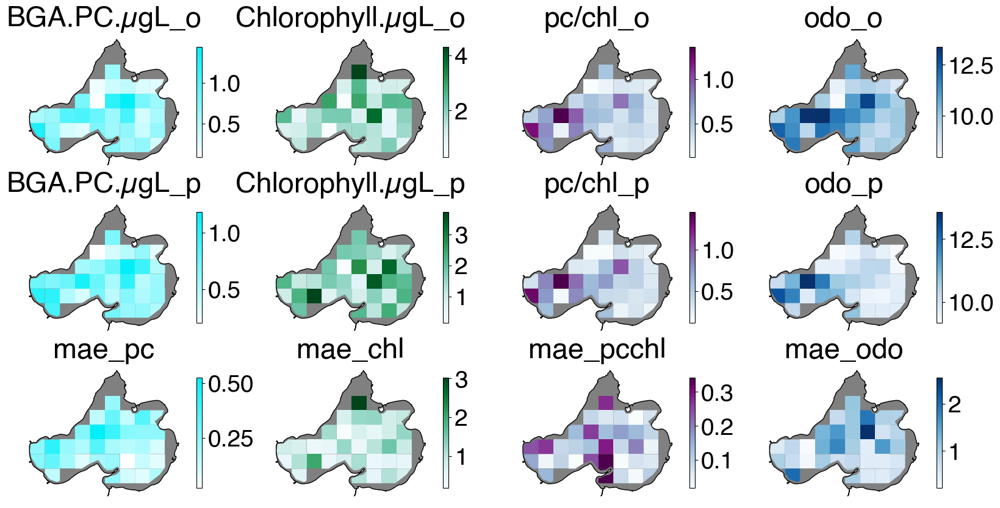

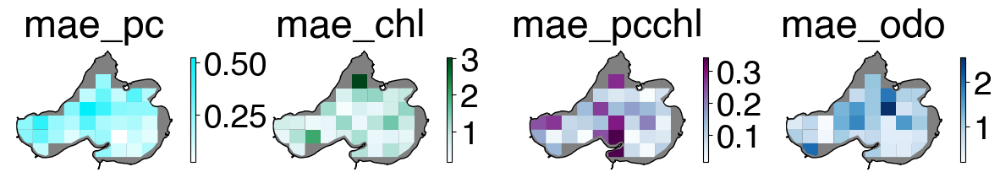

In [31]:
#cmap='coolwarm'
#cmap='winter'
mendota=mendota.to_crs(gridshp.crs)
gridshp.columns
# Suppress/hide the warning
np.seterr(invalid='ignore')

colormaps = [cyan_cmp,'BuGn','BuPu','Blues'] + [cyan_cmp,'BuGn','BuPu','Blues'] + [cyan_cmp,'BuGn','BuPu','Blues']

nrows = 3
ncols = 4
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(20,10), sharey=False)
plotnames_merr = ['pc_err','chl_err', 'pcchl_err', 'odo_err']
plotnames_mae = ['mae_pc', 'mae_chl', 'mae_pcchl','mae_odo']
plotnames_o = ['BGA.PC.µgL_o', 'Chlorophyll.µgL_o', 'pc/chl_o', 'odo_o',]
plotnames_p = ['BGA.PC.µgL_p', 'Chlorophyll.µgL_p', 'pc/chl_p', 'odo_p',]

plotnames = plotnames_o + plotnames_p + plotnames_mae

print(plotnames)
for i, ax in enumerate(axes.flatten()):
    mendota.plot(ax=ax,edgecolor="black",facecolor="gray")
    gridshp_f.plot(column = plotnames[i],ax=ax,legend=True,cmap=colormaps[i],legend_kwds={'shrink': 0.8})
    ax.set_title(plotnames[i])
    ax.set_aspect('auto')
    ax.set_axis_off()
plt.show()


plotnames_mae = ['mae_pc', 'mae_chl', 'mae_pcchl','mae_odo']
labels_mae = ['Phycocyanin', 'Chlorophyll-a', 'Pc:Chl','Dissolved Oxygen']

#Map plot error
nrows = 1
ncols = 4
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,2), sharey=False)

for i, ax in enumerate(axes.flatten()):
    mendota.plot(ax=ax,edgecolor="black",facecolor="gray")
    gridshp_f.plot(column = plotnames_mae[i],ax=ax,legend=True,cmap=colormaps[i],legend_kwds={'shrink': 0.8})
    ax.set_title(plotnames_mae[i])
    ax.set_aspect('auto')
    ax.set_axis_off()
plt.show()



KeyError: 'mae_pc'

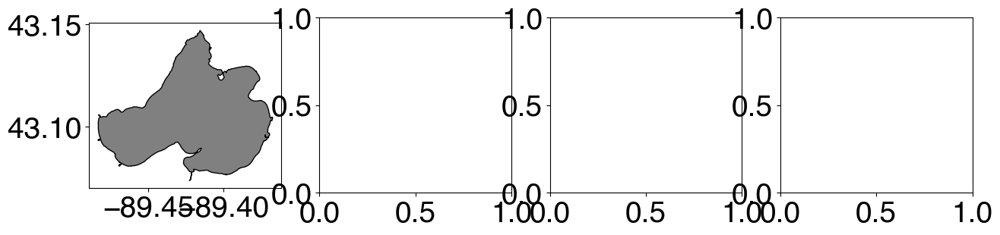

In [24]:
#Map plot error
plotnames_mae = ['mae_pc', 'mae_chl', 'mae_pcchl','mae_odo']
labels_mae = ['Phycocyanin', 'Chlorophyll-a', 'Pc:Chl','Dissolved Oxygen']
cbmax = [0.5,3,0.5,3]
nrows = 1
ncols = 4
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(15,3), sharey=False)

for i, ax in enumerate(axes.flatten()):
    mendota.plot(ax=ax,edgecolor="black",facecolor="gray")
    gridshp_f.plot(column = plotnames_mae[i],ax=ax,legend=True,cmap=colormaps[i],legend_kwds={'shrink': 0.8},vmax=cbmax[i],vmin=0)
    ax.set_title(labels_mae[i])
    ax.set_aspect('auto')
    ax.set_axis_off()
fig.tight_layout()
plt.show()






In [ ]:


# Styling
plt.style.use("default")
plt.rcParams["font.family"] = "helvetica"
plt.rcParams["font.size"] = 28

font = 30
psize = 50

# Create Blank Figure
fig = plt.figure(figsize=(37, 14))
# Create Grid
gs = fig.add_gridspec(nrows=2, ncols=4)

# Create Three Axes Objects
ax1 = fig.add_subplot(gs[0, 0])
ax2 = fig.add_subplot(gs[0, 1])
ax3 = fig.add_subplot(gs[0, 2])
ax4 = fig.add_subplot(gs[0, 3])


# Plot Data
xy_line = range(0,14)
ax1.scatter(rf_testout['Chlorophyll.µgL'],rf_predout['Chlorophyll.µgL'], color="forestgreen", linewidth=1,s=psize)
ax1.axline((-1,-1),(14,14), linestyle='--',color='red')
ax1.set_xlabel('Observed Chlorophyll-a (µg/L)')
ax1.set_ylabel('Modeled Chlorophyll-a (µg/L)')
ax1.axis('equal')
ax1.text(0, 11, 'R²=%s' % round(r2_score(rf_testout['Chlorophyll.µgL'],rf_predout['Chlorophyll.µgL']),2), fontsize=font)


xy_line = range(0,4)
ax2.scatter(rf_testout['BGA.PC.µgL'],rf_predout['BGA.PC.µgL'], color="cyan", linewidth=1,s=psize)
ax2.axline((-1,-1),(3,3), linestyle='--',color='red')
ax2.set_xlabel('Observed Phycocyanin (µg/L)')
ax2.set_ylabel('Modeled Phycocyanin (µg/L)')
ax2.axis('equal')
ax2.text(-0.5, 2, 'R²=%s' % round(r2_score(rf_testout['BGA.PC.µgL'],rf_predout['BGA.PC.µgL']),2), fontsize=font)



xy_line = range(0,4)
ax3.scatter(rf_testout['pc/chl'],rf_predout['pc/chl'], color="indigo",s=psize)
ax3.axline((-1,-1),(3,3), linestyle='--',color='red')
ax3.set_xlabel('Observed Pc/Chla (µgL-1/µgL-1)')
ax3.set_ylabel('Modeled Pc/Chla (µgL-1/µgL-1)')
ax3.axis('equal')
ax3.text(-0.5, 2, 'R²=%s' % round(r2_score(rf_testout['pc/chl'],rf_predout['pc/chl']),2), fontsize=font)


ax4.axline((0,0),(25,25),linestyle='--',color='red')
ax4.scatter(odoObs['ODO.mg.L'],odopred_rs, color="steelblue", s=psize)
ax4.set_xlabel('Observed Dissolved Oxygen (mg/L)')
ax4.set_ylabel('Modeled Dissolved Oxygen (mg/L)')
ax4.axis('equal')
ax4.text(4, 19, 'R²=%s' % round(r2_score(odoObs['ODO.mg.L'],odopred_rs),2), fontsize=font)



# Create Next Three Axes Objects
ax5 = fig.add_subplot(gs[1, 0])
ax6 = fig.add_subplot(gs[1, 1])
ax7 = fig.add_subplot(gs[1, 2])
ax8 = fig.add_subplot(gs[1, 3])


plotnames_mae = ['mae_chl','mae_pc', 'mae_pcchl','mae_odo']
labels_mae = ['Chlorophyll-a','Phycocyanin', 'Pc:Chl','Dissolved Oxygen']
cbmax = [3,0.5,0.5,3]

mendota.plot(ax=ax5,edgecolor="black",facecolor="gray")
gridshp_f.plot(column = plotnames_mae[0],ax=ax5,legend=True,cmap=colormaps[1],legend_kwds={'shrink': 0.8},vmax=cbmax[0],vmin=0)
ax5.set_aspect('auto')
ax5.set_axis_off()

mendota.plot(ax=ax6,edgecolor="black",facecolor="gray")
gridshp_f.plot(column = plotnames_mae[1],ax=ax6,legend=True,cmap=colormaps[0],legend_kwds={'shrink': 0.8},vmax=cbmax[1],vmin=0)
ax6.set_aspect('auto')
ax6.set_axis_off()

mendota.plot(ax=ax7,edgecolor="black",facecolor="gray")
gridshp_f.plot(column = plotnames_mae[2],ax=ax7,legend=True,cmap=colormaps[2],legend_kwds={'shrink': 0.8},vmax=cbmax[2],vmin=0)
ax7.set_aspect('auto')
ax7.set_axis_off()

mendota.plot(ax=ax8,edgecolor="black",facecolor="gray")
gridshp_f.plot(column = plotnames_mae[3],ax=ax8,legend=True,cmap=colormaps[3],legend_kwds={'shrink': 0.8},vmax=cbmax[3],vmin=0)
ax8.set_aspect('auto')
ax8.set_axis_off()




fig.suptitle("")
fig.tight_layout()
plt.show()



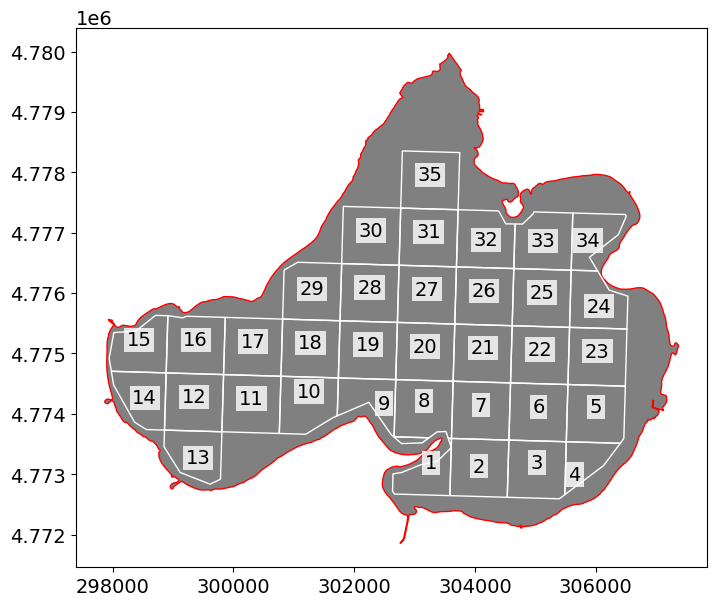

25    2.127782
18    1.921318
12    1.774392
31    1.752708
17    1.517673
        ...   
2     0.494965
4     0.447110
6     0.393980
10    0.190720
16    0.157038
Name: mae_odo, Length: 35, dtype: float64
1.6586941120856835


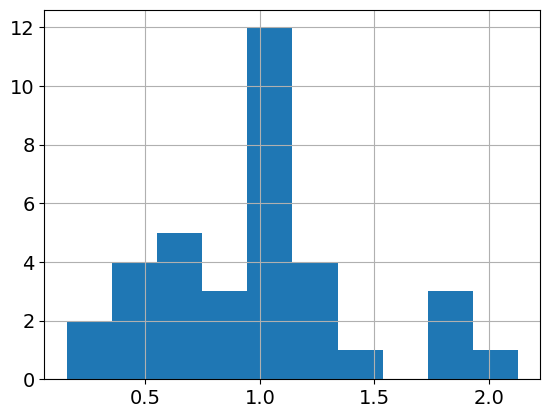

In [33]:


#Representative point returns a cheaply computed point that is guaranteed to be within the geometric object. Good for labels.
gridshp['coords'] = gridshp['geometry'].apply(lambda x: x.representative_point().coords[:])
gridshp['coords'] = [coords[0] for coords in gridshp['coords']]

fig, ax = plt.subplots(figsize=(10,7))
mendota.plot(ax=ax,edgecolor="r",facecolor="gray")
gridshp.plot(ax=ax,edgecolor='white',facecolor="none")
for idx, row in gridshp.iterrows():
    plt.annotate(text=row['ID'], xy=row['coords'],
                 horizontalalignment='center', 
                 bbox={'facecolor': 'white', 'alpha':0.8, 'pad': 2, 'edgecolor':'none'})
    
plt.show()


    
gridshp_f['mae_odo'].hist()
print(gridshp_f['mae_odo'].sort_values(ascending=False))
print(gridshp_f['mae_odo'].quantile(.9))




## Investigate Error by Date

KeyError: 'Date'

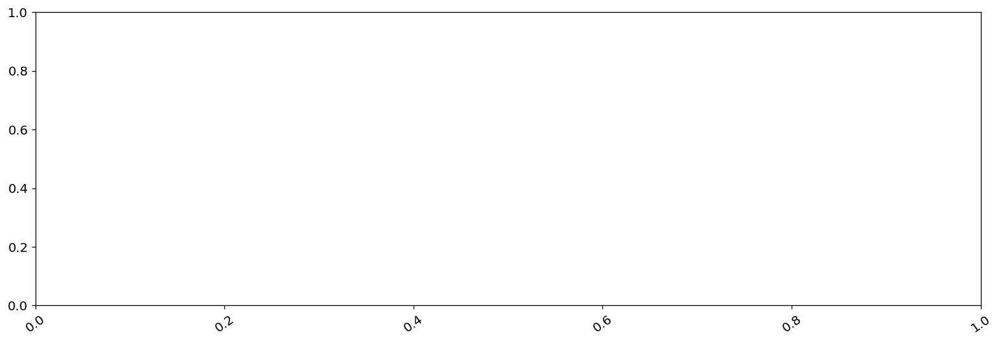

In [57]:
plt.style.use("default")
plt.rcParams["font.size"] = 12

figure(figsize=(16, 5), dpi=120)
plt.xticks(rotation=35)
plt.scatter(obs_preds_all['Date'],obs_preds_all['pc_err'], label="Phycocyanin",facecolor="cyan")
plt.axhline(y=0, color='r', linestyle='--',zorder=0)
#plt.scatter(obs_preds_all['Date'],obs_preds_all['chl_err'], label="Chlorophyll-a",facecolor="forestgreen",alpha=0.5)
plt.ylabel('µg/L')


figure(figsize=(16, 5), dpi=120)
plt.xticks(rotation=35)
plt.scatter(obs_preds_all['Date'],obs_preds_all['chl_err'], label="Chlorophyll-a",facecolor="forestgreen")
plt.axhline(y=0, color='r', linestyle='--',zorder=0)
plt.ylabel('µg/L')


figure(figsize=(16, 5), dpi=120)
plt.xticks(rotation=35)
plt.scatter(obs_preds_all['Date'],obs_preds_all['pcchl_err'], label="Chlorophyll-a",facecolor="indigo")
plt.axhline(y=0, color='r', linestyle='--',zorder=0)
plt.ylabel('µg/L')


figure(figsize=(16, 5), dpi=120)
plt.xticks(rotation=35)
plt.scatter(obs_preds_all['Date'],obs_preds_all['odo_err'], label="Chlorophyll-a",facecolor="blue")
plt.axhline(y=0, color='r', linestyle='--',zorder=0)
plt.ylabel('µg/L')


figure(figsize=(16, 5), dpi=120)
plt.xticks(rotation=35)
plt.scatter(obs_preds_all['Date'],obs_preds_all['pc_err'], label="Phycocyanin",facecolor="cyan",alpha=0.25)
plt.scatter(obs_preds_all['Date'],obs_preds_all['chl_err'], label="Chlorophyll-a",facecolor="forestgreen",alpha=0.25)
plt.scatter(obs_preds_all['Date'],obs_preds_all['pcchl_err'], label="Chlorophyll-a",facecolor="indigo",alpha=0.25)
plt.scatter(obs_preds_all['Date'],obs_preds_all['odo_err'], label="Chlorophyll-a",facecolor="blue",alpha=0.25)
plt.axhline(y=0, color='r', linestyle='--',zorder=0)
plt.ylabel('µg/L')


# Create pseudo-observations

### Pseudo-observation predictions

In [50]:
import rasterio
from rasterio.plot import show
import os
from rasterio.plot import reshape_as_raster, reshape_as_image
from rasterio.mask import mask
from matplotlib import pyplot
from sklearn.impute import SimpleImputer


#best models
#pc_rfr
#chla_ann
#pcchla_rfr


#Choose outpath for saving prediction tiffs
outpath = '/Users/maxbeal/Desktop/PhD/Remote Sensing/pseudo_obs/s2_psuedo_obs/s2_chl_preds'

predictand = 'Chlorophyll.µgL'



fp = os.walk('/Users/maxbeal/Desktop/PhD/Remote Sensing/pseudo_obs/s2_pseudo_obs')

#Read in shapefiles
mendota2 = gpd.read_file("/Users/maxbeal/Desktop/PhD/Sampling/Mendota Shapefiles/Mendotaboundary.shp")
grid = gpd.read_file('/Users/maxbeal/Desktop/PhD/Sampling/box_sampling_bryan/MendotaSamplingBoundaries.shp')
crs = {'init': 'epsg:32616'}
mendota2= mendota2.to_crs(crs)
grid = grid.to_crs(crs)

#Loop to take raw images, perform band math, mask land, and save to google drive
for root, dirs, files in os.walk('/Users/maxbeal/Desktop/PhD/Remote Sensing/pseudo_obs/s2_tifs', topdown=False):
  files.remove('.DS_Store') #Remove non tif file
  for name in files:
    fp = os.path.join(root, name)
    img = rasterio.open(fp)
    image = img.read()
    #show(img)
    #create mask

    if len(image[image>0])>0:
      
      image = reshape_as_image(image)
        
      #Acolite algorthims
      Bramich_chl = image[:,:,0]
      Gons_chl = image[:,:,1]
      Mishra_chl = image[:,:,2]
      Moses3b_chl = image[:,:,3]
      l2_flags = image[:,:,4]
      NDCI = image[:,:,5]
    
      #Bands
      B11 = image[:,:,6] #1614
      B12 = image[:,:,7] #2202
      B1 = image[:,:,8] #443
      B2 = image[:,:,9] #492
      B3 = image[:,:,10] #560
      B4 = image[:,:,11] #665
      B5 = image[:,:,12] #704
      B6 = image[:,:,13] #740
      B7 = image[:,:,14] #783
      B8 = image[:,:,15] #833
      B8A = image[:,:,16] #865

    
    
      #Band math
      #'B8A - (B4 + (B11 - B4) * ((865 - 665) / (1610 - 665)))'
      FAI = B8A - (B4 + (B11 - B4) * ((865 - 665) / (1610 - 665)))

      #'B6/B4'
      B6B4div = B6/B4

      #'B6-B4'
      B6B4sub = B6-B4
          
      #'B6/B5'
      B6B5div = B6/B5

      #'B6-B5'
      B6B5sub = B6-B5

      #'B5/B4'
      B5B4div = B5/B4

      #'B5-B4'
      B5B4sub = B5-B4
          
      #'B3-B4+B2-B4'
      B3B4_B2B4sub = B3-B4+B2-B4
          
      #'(B6-B4)/(B6+B4)'
      B6B4divB6B4 = (B6-B4)/(B6+B4)

      #'(B6-B5)/(B6+B5)'
      B6B5divB6B5 = (B6-B5)/(B6+B5)
          
      #'(B5-B4)/(B5+B4)'
      B5B4divB5B4 = (B5-B4)/(B5+B4)

      #'(B5-B4)/(B2+B3)'
      B5B4divB2B3 = (B5-B4)/(B2+B3)
          
      #'(1/B5)-(1/B4)-(B6)'
      B5B4invB6sub = (1/B5)-(1/B4)-(B6)
        

        
      arrays = [Bramich_chl, Gons_chl, Mishra_chl, Moses3b_chl, l2_flags, NDCI, 
          B11,B12,B1,B2,B3,B4,B5,B6,B7,B8,B8A,FAI,
          B6B4div, B6B4sub, B6B5div, B6B5sub, B5B4div, B5B4sub,
          B3B4_B2B4sub, B6B4divB6B4, B6B5divB6B5, B5B4divB5B4,B5B4divB2B3]
    
    

    
      pred_bands=np.stack(arrays)
        
      if predictand == 'Chlorophyll.µgL' :
        print('chla')
        pred_bands = reshape_as_image(pred_bands)
        #Reshape and stack
        imgr = pred_bands.reshape(-1,len(arrays))
        img_df = pd.DataFrame(imgr)
        
        #Scale data
        scaler = StandardScaler()
        scaler.fit(img_df)
        Xsc=scaler.transform(img_df)
        Xsc = pd.DataFrame(Xsc)
        Xsc.columns = X.columns
    
        Xsc = Xsc.fillna(-999)
        
        #Predict with best chla model
        pred_img=chla_ann.predict(Xsc)
        
      elif predictand == 'BGA.PC.µgL':
        print('pc')
        
        pred_bands=np.asarray(arrays)[bestpc]
        pred_bands = reshape_as_image(pred_bands)
        
        #Reshape and stack
        imgr = pred_bands.reshape(-1,len(bestpc))
        img_df = pd.DataFrame(imgr)
        
        #Scale data
        scaler = StandardScaler()
        scaler.fit(img_df)
        Xsc=scaler.transform(img_df)
        Xsc = pd.DataFrame(Xsc)
        Xsc.columns = X.columns[bestpc]
    
        Xsc = Xsc.fillna(-999)
        

        
        #Predict with best chla model
        pred_img=pc_rfr.predict(Xsc)
        
      elif predictand == 'pc/chl':
        print('pcchl')
        pred_bands=np.asarray(arrays)[bestpc]
        pred_bands = reshape_as_image(pred_bands)
        
        imgr = pred_bands.reshape(-1,len(bestpcchl))
        img_df = pd.DataFrame(imgr)
        
        #Scale data
        scaler = StandardScaler()
        scaler.fit(img_df)
        Xsc=scaler.transform(img_df)
        Xsc = pd.DataFrame(Xsc)
        Xsc.columns = X.columns[bestpcchl]
    
        Xsc = Xsc.fillna(-999)
        
        #Predict with best chla model
        pred_img=pcchl_rfr.predict(Xsc)


      # Reshape our regression map back into a 2D matrix so we can visualize it
      prediction = pred_img.reshape(image[:, :, 0].shape)
      print(prediction.shape)

      crs = img.crs
      mendota_clip = mendota2.to_crs(crs)
      print(crs)

      out, out_transform = mask(img, mendota_clip.geometry, invert=False, filled=True,nodata=-999)
      reshaped_out = reshape_as_image(out)

      m_ = np.ma.masked_where(reshaped_out[:,:,0]==-999, prediction)
    
      m_[m_>1000]=-999 #For chlorophyll predictions
      

      fig, ax = plt.subplots(figsize=(10,7))
      pyplot.imshow(m_, cmap='viridis')
      pyplot.colorbar(label="µg/L",orientation="vertical")
      plt.title(name)
      pyplot.show()


      #Write the prediction file to 
      with rasterio.open(
          os.path.join(outpath, name),
          'w',
          driver='GTiff',
          height=m_.shape[0],
          width=m_.shape[1],
          count=1,
          dtype=m_.dtype,
          crs = img.crs,
          transform=img.transform,
          nodata = -999
      ) as dst:
          dst.write(m_, 1)


#Figure code
crs = {'init': 'epsg:32615'}

mendota2= mendota2.to_crs(crs)
grid = grid.to_crs(crs)


fig, ax = plt.subplots(figsize=(10,7))
#pyplot.imshow(reshaped_out[:,:,3]==0, cmap='viridis')
pyplot.imshow(m_, cmap='viridis')
pyplot.colorbar(label="µg/L",orientation="vertical")
plt.title(name)
pyplot.show()




chla


/Users/maxbeal/opt/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/Users/maxbeal/opt/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


NameError: name 'StandardScaler' is not defined

### Create plots of all predictions

/Users/maxbeal/opt/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/Users/maxbeal/opt/anaconda3/lib/python3.8/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


IndexError: list index out of range

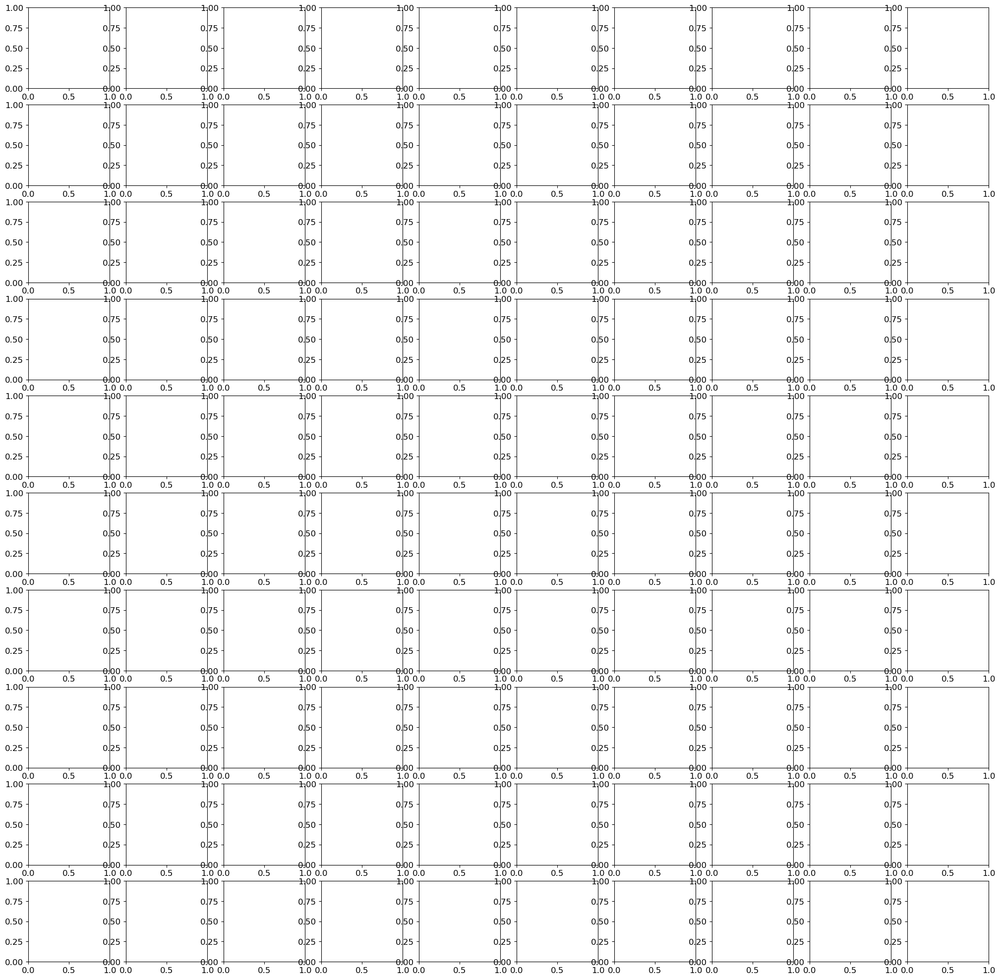

In [31]:
import matplotlib.pyplot as plt
from matplotlib import image
import numpy as np
import os
import rasterio
from rasterio.plot import show
import geopandas as gpd
from rasterio.plot import reshape_as_raster, reshape_as_image
from rasterio.mask import mask

mendota2 = gpd.read_file("/Users/maxbeal/Desktop/PhD/Sampling/Mendota Shapefiles/Mendotaboundary.shp")
grid = gpd.read_file('/Users/maxbeal/Desktop/PhD/Sampling/box_sampling_bryan/MendotaSamplingBoundaries.shp')
crs = {'init': 'epsg:32616'}
mendota2= mendota2.to_crs(crs)
grid = grid.to_crs(crs)

# initialise grid of axes
fig, axes = plt.subplots(10,10,figsize=(25,25))
axes = axes.ravel()

imgs = []
#Loop to take raw images, perform band math, mask land, and save to google drive
for root, dirs, files in os.walk('/Users/maxbeal/Desktop/PhD/Remote Sensing/pseudo_obs/s2_psuedo_obs/s2_pcchl_preds', topdown=False):
  for name in files:
    fp = os.path.join(root, name)
    imgs = imgs + [fp]

# iterate over axes
for i, ax in enumerate(axes):
    pred = rasterio.open(imgs[i])
    pred_arr = pred.read()
    crs = pred.crs
    mendota_clip = mendota2.to_crs(crs)
    out, out_transform = mask(pred, mendota_clip.geometry, invert=False, filled=True,nodata=0.6778582801706808)
    reshaped_out = reshape_as_image(out)
    #m_ = np.ma.masked_where(reshaped_out[:,:,0]==-999, pred_arr[0,:,:])
    m_ = np.ma.masked_where(reshaped_out[:,:,0]==0.6778582801706808, pred_arr[0,:,:])
    show(m_, ax=ax, vmin=0, vmax=3,transform = pred.transform,title=files[i],cmap='viridis') 
    mendota2= mendota2.to_crs(crs)
    grid = grid.to_crs(crs)
    grid.plot(ax=ax, facecolor='none', edgecolor='gray')
    mendota2.plot(ax=ax, facecolor='none', edgecolor='black')
    ax.tick_params(axis='x', colors='w') 
    ax.tick_params(axis='y', colors='w')



plt.show()


image_hidden = ax.imshow(m_, vmin=0, vmax=3,cmap='viridis')
fig, ax = plt.subplots(figsize=(10,7))
show(m_, ax=ax, vmin=0, vmax=3,transform = pred.transform,title=files[i],cmap='viridis')
mendota2.plot(ax=ax, facecolor='none', edgecolor='black')
grid.plot(ax=ax, facecolor='none', edgecolor='w')
fig.colorbar(image_hidden, ax=ax,label="µg/L")
plt.show()


pred_arr[0,100,100] #no data value

# #no data chla
# #no data pc
#0.6778582801706808 #no data pc/chl

show(pred)


### Save predictions from all dates into one tif

In [196]:
imgs=[]
predictions = []
#Loop to take raw images, perform band math, mask land, and save to google drive
for root, dirs, files in os.walk('/Users/maxbeal/Desktop/PhD/Remote Sensing/pseudo_obs/s2_psuedo_obs/s2_pc_preds', topdown=False):
  for name in files:
    if name[-9:]=='.DS_Store':
        print('skip')
        next
    else:
        fp = os.path.join(root, name)
        imgs = imgs + [fp]
        pred = [rasterio.open(fp)]
        predictions = predictions + pred


# Read metadata of first file
meta = predictions[0].meta

# Update meta to reflect the number of layers
meta.update(count = len(predictions))

print('Saving image...')
# Read each layer and write it to stack
with rasterio.open('/Users/maxbeal/Desktop/PhD/Remote Sensing/pseudo_obs/s2_psuedo_obs/pc_RF.tif', 'w', **meta) as dst:
    for id, layer in enumerate(predictions, start=1):
        with layer as src1:
            dst.write_band(id, src1.read(1))
print('Complete')

skip
Saving image...
Complete


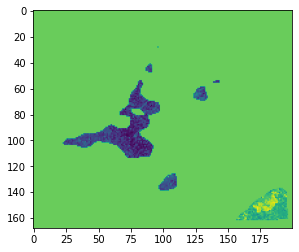

array([[1.2072375, 1.2072375, 1.2072375, ..., 1.2072375, 1.2072375,
        1.2072375],
       [1.2072375, 1.2072375, 1.2072375, ..., 1.2072375, 1.2072375,
        1.2072375],
       [1.2072375, 1.2072375, 1.2072375, ..., 1.2072375, 1.2072375,
        1.2072375],
       ...,
       [1.2072375, 1.2072375, 1.2072375, ..., 1.2072375, 1.2072375,
        1.2072375],
       [1.2072375, 1.2072375, 1.2072375, ..., 1.2072375, 1.2072375,
        1.2072375],
       [1.2072375, 1.2072375, 1.2072375, ..., 1.2072375, 1.2072375,
        1.2072375]])

In [2]:
import rasterio
from rasterio.mask import mask
from rasterio.plot import reshape_as_raster, reshape_as_image
from rasterio.plot import show
import matplotlib.pyplot as plt

fn = '/Users/maxbeal/Desktop/PhD/Remote Sensing/pseudo_obs/s2_psuedo_obs/pc_RF.tif'
pcchl=rasterio.open(fn)
pcchl = pcchl.read()

show(pcchl[0,:,:])

pcchl[0,:,:]


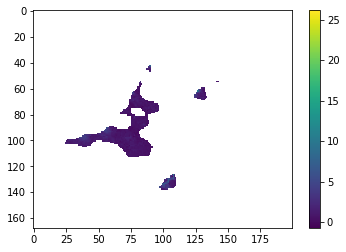

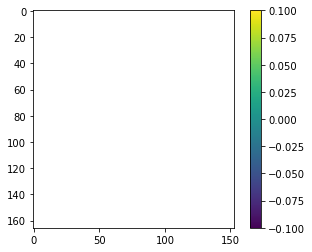

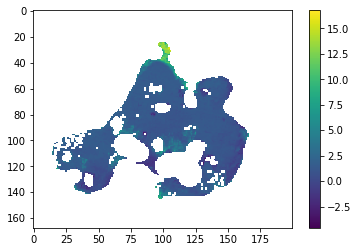

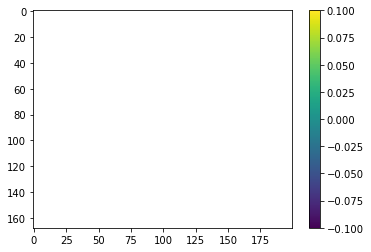

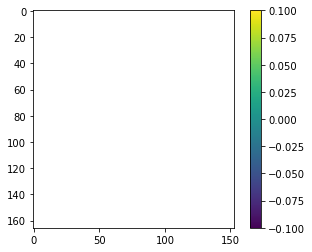

...

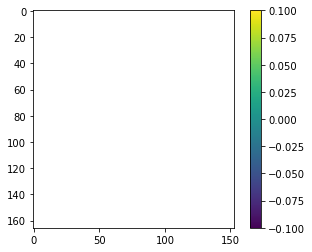

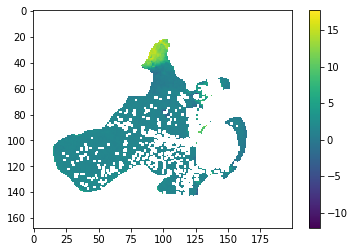

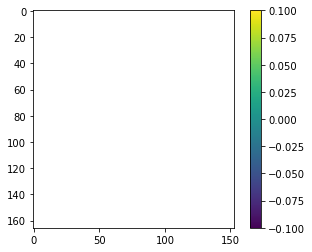

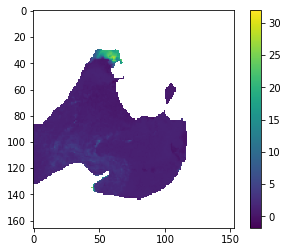

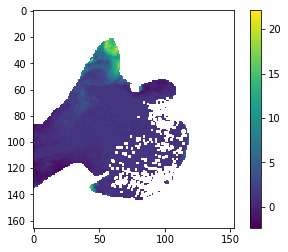

,mean,Beach,Date
0,NaN,NaN,NaN
0,4976.479403,James Madison,2022-06-22
1,4976.479492,Tenney,2022-06-22
2,4976.479167,Warner,2022-06-22
3,4976.479403,Spring Harbor,2022-06-22
...,...,...,...
2,3318.098090,Warner,2018-09-16
3,NaN,Spring Harbor,2018-09-16
4,NaN,Madison County Park,2018-09-16
5,3246.096875,Memorial Union,2018-09-16


In [46]:
#!pip install rasterstats
import rasterio
from rasterio.plot import show
import os
from rasterio.plot import reshape_as_raster, reshape_as_image
from rasterio.mask import mask
from matplotlib import pyplot
import datetime
from itertools import compress
from rasterstats import zonal_stats

#6.510321992762746 #no data chla
#0.6240143485448633 #no data pc
#0.94166365 #no data pc/chl

chl = 'Chlorophyll.µgL'
pc = 'BGA.PC.µgL'
pc_chl = 'pc/chl'

predictand = chl

if predictand == chl:
  no_data_val=-999 
  pred_path = '/Users/maxbeal/Desktop/PhD/Remote Sensing/pseudo_obs/s2_psuedo_obs/s2_chl_preds'
elif predictand == pc:
  no_data_val=1.2072375046445918
  pred_path = '/Users/maxbeal/Desktop/PhD/Remote Sensing/pseudo_obs/s2_psuedo_obs/s2_pc_preds'
elif predictand == pc_chl:
  no_data_val=0.9416636542553238
  pred_path = '/Users/maxbeal/Desktop/PhD/Remote Sensing/pseudo_obs/s2_psuedo_obs/s2_pcchl_preds'

#Beach shapefiles
#100m
'''
jm = gpd.read_file('/content/drive/MyDrive/RS_beaches/jm_100m_clip.shp')
ten = gpd.read_file('/content/drive/MyDrive/RS_beaches/ten_100m_clip.shp')
war = gpd.read_file('/content/drive/MyDrive/RS_beaches/war_100m_clip.shp')
sh = gpd.read_file('/content/drive/MyDrive/RS_beaches/sh_100m_clip.shp')
mcp = gpd.read_file('/content/drive/MyDrive/RS_beaches/mcp_100m_clip.shp')
mem = gpd.read_file('/content/drive/MyDrive/RS_beaches/mem_100m_clip.shp')
mar = gpd.read_file('/content/drive/MyDrive/RS_beaches/mar_100m_clip.shp')
'''
#200m
jm = gpd.read_file('/Users/maxbeal/Desktop/PhD/Remote Sensing/RS_beaches/jm_200m_clip.shp')
ten = gpd.read_file('/Users/maxbeal/Desktop/PhD/Remote Sensing/RS_beaches/ten_200m_clip.shp')
war = gpd.read_file('/Users/maxbeal/Desktop/PhD/Remote Sensing/RS_beaches/war_200m_clip.shp')
sh = gpd.read_file('/Users/maxbeal/Desktop/PhD/Remote Sensing/RS_beaches/sh_200m_clip.shp')
mcp = gpd.read_file('/Users/maxbeal/Desktop/PhD/Remote Sensing/RS_beaches/mcp_200m_clip.shp')
mem = gpd.read_file('/Users/maxbeal/Desktop/PhD/Remote Sensing/RS_beaches/mem_200m_clip.shp')
mar = gpd.read_file('/Users/maxbeal/Desktop/PhD/Remote Sensing/RS_beaches/mar_200m_clip.shp')

mendota2 = gpd.read_file("/Users/maxbeal/Desktop/PhD/Sampling/Mendota Shapefiles/Mendotaboundary.shp")


#Beach closing data
bc=pd.read_csv('/Users/maxbeal/Desktop/PhD/Remote Sensing/cyano_beachclosing.csv')
bc=bc[bc['lake']=='Mendota']


imgs = []
dates = []
datelist_tf= []
Dateset = list(bc['sampledate'])

#Loop to take raw images, perform band math, mask land, and save to google drive
for root, dirs, files in os.walk(pred_path, topdown=False):
  for name in files:
    if name[-9:]=='.DS_Store':
        print('skip')
        next
    else:
        fp = os.path.join(root, name)
        imgs = imgs + [fp]
        dates = dates + [name[0:10]]
        tf = name[0:10] in Dateset
        datelist_tf.append(tf)



Datelist=list(compress(dates, datelist_tf))



zs_all = pd.DataFrame({"mean":[np.nan],
                      "Beach":[np.nan]})

for i, img in enumerate(imgs):
  #hold=bc[bc['sampledate'] == date]
  pred = rasterio.open(img)
  pred_arr = pred.read()
  crs = pred.crs
  mendota_clip = mendota2.to_crs(crs)
  out, out_transform = mask(pred, mendota_clip.geometry, invert=False, filled=True,nodata=no_data_val)
  reshaped_out = reshape_as_image(out)  
  m_ = np.ma.masked_where(reshaped_out[:,:,0]==no_data_val, pred_arr[0,:,:]) 
    

    

  #show(m_, vmin=0, vmax=3,transform = pred.transform,cmap='viridis')
  plt.imshow(m_)
  plt.colorbar()
  plt.show()

  mendota2= mendota2.to_crs(crs)
  jm = jm.to_crs(crs)
  zs_jm = zonal_stats(jm, m_, affine=pred.transform, stats=['mean'],nodata=no_data_val)
  ten = ten.to_crs(crs)
  zs_ten = zonal_stats(ten, m_, affine=pred.transform, stats=['mean'],nodata=no_data_val)
  war = war.to_crs(crs)
  zs_war = zonal_stats(war, m_, affine=pred.transform, stats=['mean'],nodata=no_data_val)
  sh = sh.to_crs(crs)
  zs_sh = zonal_stats(sh, m_, affine=pred.transform, stats=['mean'],nodata=no_data_val)
  mcp = mcp.to_crs(crs)
  zs_mcp = zonal_stats(mcp, m_, affine=pred.transform, stats=['mean'],nodata=no_data_val)
  mem = mem.to_crs(crs)
  zs_mem = zonal_stats(mem, m_, affine=pred.transform, stats=['mean'],nodata=no_data_val)
  mar = mar.to_crs(crs)
  zs_mar = zonal_stats(mar, m_, affine=pred.transform, stats=['mean'],nodata=no_data_val)


  zs=pd.DataFrame(zs_jm+zs_ten+zs_war+zs_sh+zs_mcp+zs_mem+zs_mar)
  beach = pd.DataFrame({"Beach":["James Madison","Tenney","Warner","Spring Harbor","Madison County Park","Memorial Union","Marshall"]})
  date = files[i][0:10]
  zs['Beach'] = beach
  zs['Date'] = date

  zs_all=zs_all.append(zs)



  
zs_all

#Save Beaches data to csv
#zs_all.to_csv('/Users/maxbeal/Desktop/PhD/Remote Sensing/pcchl_beaches_200m.csv')


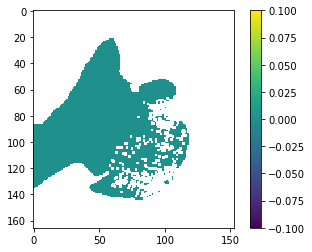

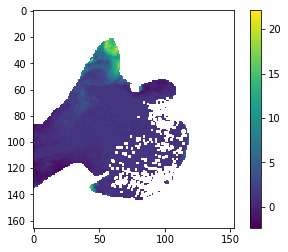

,mean,Beach,Date
0,NaN,NaN,NaN
0,4976.479403,James Madison,2022-06-22
1,4976.479492,Tenney,2022-06-22
2,4976.479167,Warner,2022-06-22
3,4976.479403,Spring Harbor,2022-06-22
...,...,...,...
2,3318.098090,Warner,2018-09-16
3,NaN,Spring Harbor,2018-09-16
4,NaN,Madison County Park,2018-09-16
5,3246.096875,Memorial Union,2018-09-16


In [49]:
from rasterio.plot import show_hist
#show_hist(m_)

m_[m_.mask == False]

plt.imshow(m_>1000)
plt.colorbar()
plt.show()

#zs_all.to_csv('/Users/maxbeal/Desktop/PhD/Remote Sensing/chl_beaches_200m.csv')



plt.imshow(m_)
plt.colorbar()
plt.show()


zs_all

closed  Beach              
False   James Madison          4688.318776
        Madison County Park    4976.489469
        Marshall               4915.541233
        Memorial Union         4819.668951
        Spring Harbor          4847.438647
                                  ...     
True    Marshall               4787.093378
        Memorial Union         4976.522958
        Spring Harbor          4901.255268
        Tenney                 4976.485776
        Warner                 4436.881366
Name: mean, Length: 13, dtype: float64
closed  Beach              
False   James Madison          670.635907
        Madison County Park      0.016601
        Marshall               171.143577
        Memorial Union         345.657034
        Spring Harbor          345.098597
                                  ...    
True    Marshall               375.938508
        Memorial Union           0.022039
        Spring Harbor          184.316594
        Tenney                   0.004744
        Warn

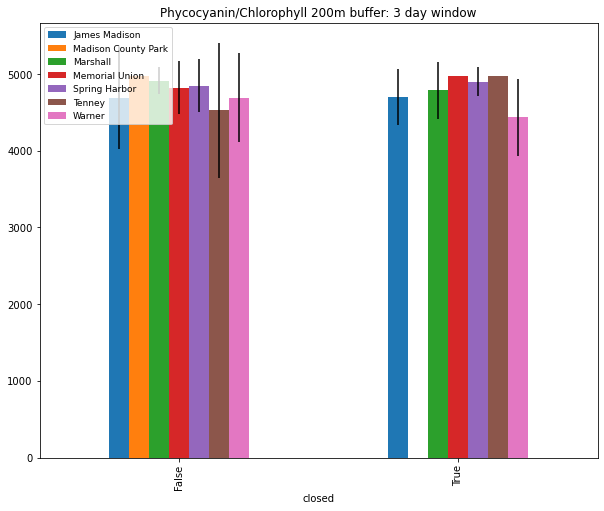

2019-08-22
['2019-08-21', '2019-08-22', '2019-08-23']


In [48]:
import pandas as pd
from datetime import timedelta
import datetime

beach = pd.read_csv('/Users/maxbeal/Desktop/PhD/Remote Sensing/chl_beaches_200m.csv') #Zonal statistics in each beach region 
beach=beach[beach['Date']!='.DS_Store']
beach['month']=pd.DatetimeIndex(beach['Date']).month

#subset to beach monitoring season
beach=beach[(beach['month']>=6) & (beach['month']<=8)]



dates = []
datelist_tf= []
beachname = []
datename = []
mean = []

d = {}
for b in beach['Beach']: #Subset beach
  sub = bc[bc['Beach']==b] #This is a subset of the beach closure data
  Dateset = list(sub['sampledate'])
  datelist_tf= []
  beachname = []
  datename = []
  mean = []
  for i, date in enumerate(beach[beach['Beach']==b]['Date']): #Which satellite days (used for zonal beach stats) coincide with beach closures?
    date_extend = []
    numdays=2 #Choose number of days to extend range by (i.e., is there a closure within 3 days (5 day window), 4 days (7 day window) of satellite pass, etc.)
    for x in range (0, numdays):
      date_extend.append((pd.to_datetime(date) + timedelta(days=x)).strftime("%Y-%m-%d"))
      date_extend.append((pd.to_datetime(date) - timedelta(days=x)).strftime("%Y-%m-%d"))
      date_extend = list(np.unique(date_extend))
    
    datelist_tf.append(any(date in Dateset for date in date_extend))
    beachname.append(b)
    datename.append(date)
    mean.append(beach[beach['Beach']==b]['mean'].iloc[i])
  d[b+' closed'] = pd.DataFrame({'closed':datelist_tf,'Beach':beachname,'Date':datename,'mean':mean})

jm_close = pd.DataFrame(d['James Madison closed'])
mcp_close = pd.DataFrame(d['Madison County Park closed'])
mar_close = pd.DataFrame(d['Marshall closed'])
mem_close = pd.DataFrame(d['Memorial Union closed'])
sh_close = pd.DataFrame(d['Spring Harbor closed'])
ten_close = pd.DataFrame(d['Tenney closed'])
war_close = pd.DataFrame(d['Warner closed'])

beach = pd.concat([jm_close,mcp_close,mar_close,mem_close,sh_close,ten_close,war_close])


print(beach.groupby(['closed','Beach'])['mean'].mean())
print(beach.groupby(['closed','Beach'])['mean'].std())

st_err = beach.groupby(['closed','Beach'])['mean'].std().unstack()

print(beach.groupby('closed')['Beach'].count())

df = beach.groupby(['closed','Beach'])['mean'].mean().unstack()
df.plot.bar(figsize=(10,8), yerr = st_err).legend(loc=2, prop={'size': 9})
win = (numdays*2)-1
title = "Phycocyanin/Chlorophyll 200m buffer: {} day window".format(win)
plt.title(title)
plt.show()

print(date)
print(date_extend)


### Kmeans clustering

Phycocyanin/Chlorophyll 200m buffer: 7 day window
